# **DeepFake Detection</br>**
## By: Shiv Vyas</br>


----

In [ ]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Introduction : Objective of Project & What are DeepFakes?

---



The objective of this project is to detect if anything is wrong with a video or image i.e. to classify between “REAL” and “FAKE”. A deepfake refers to a specific kind of synthetic media where a person in an image or video is swapped with another person's likeness. 
The deepfake uses the Neural NEtwork Techniques in such an accurate and perfect way that it is almost impossible for a naked human eye to differentiate between the real and the fake videos/Images.


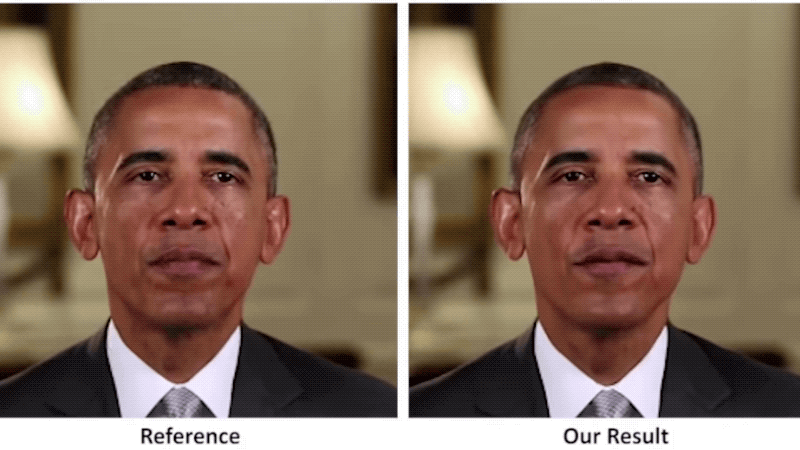

#How DeepFakes are created?

###The initial step is to gather the face data, by finding the videos/images of the source person and target whose deepfake is to be created.</br>Faces are located and extracted from these data, it can be done using some of the pre-trained models for face detection such as MT-CNN, FaceNet, etc.</br>Autoencoder is used to compress and decompress the facial features.This helps the model to perfectly learn how to store the facial features of the source and target.




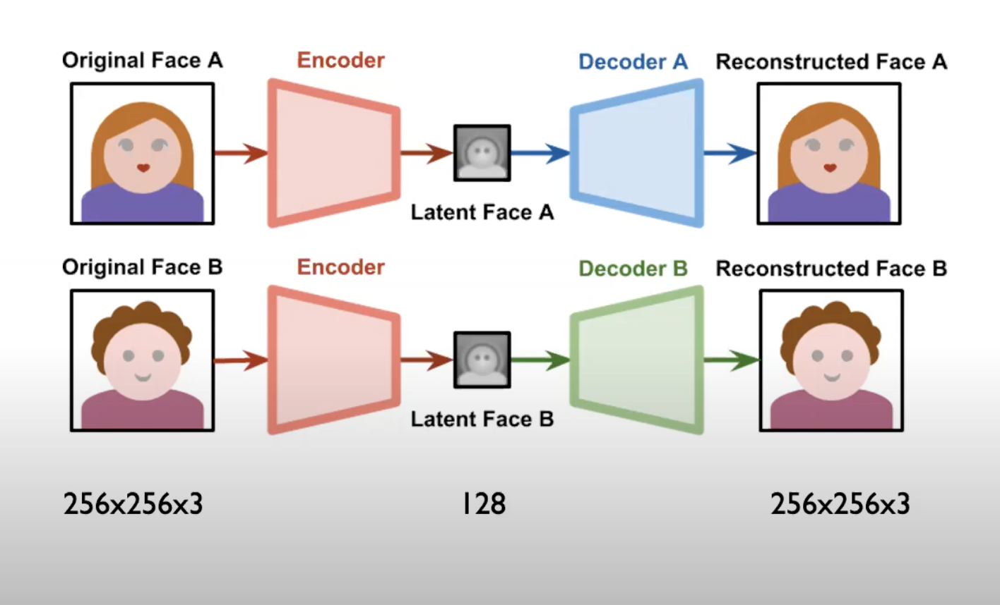

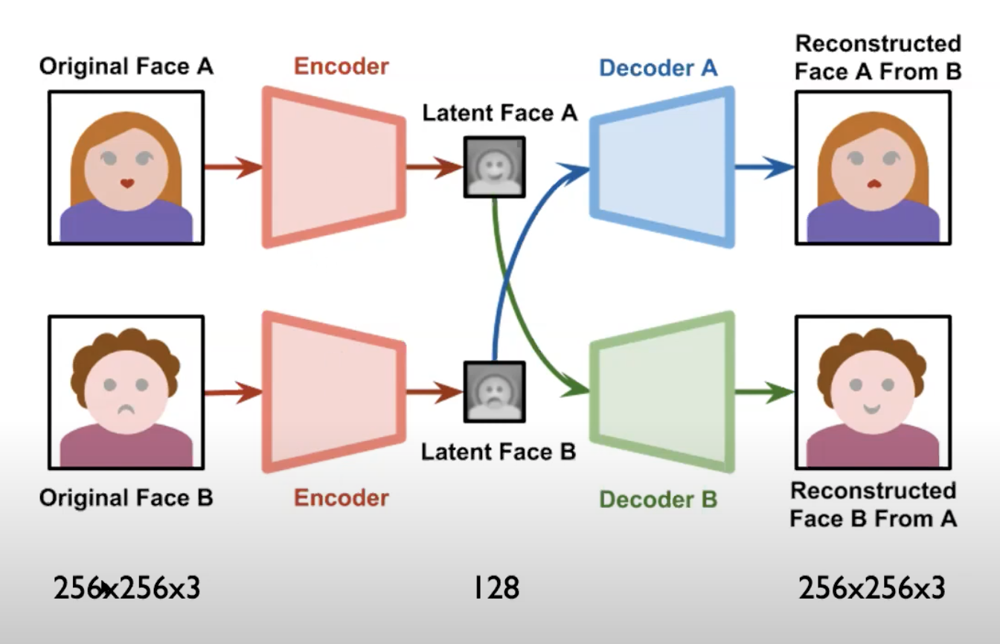

#Project Description

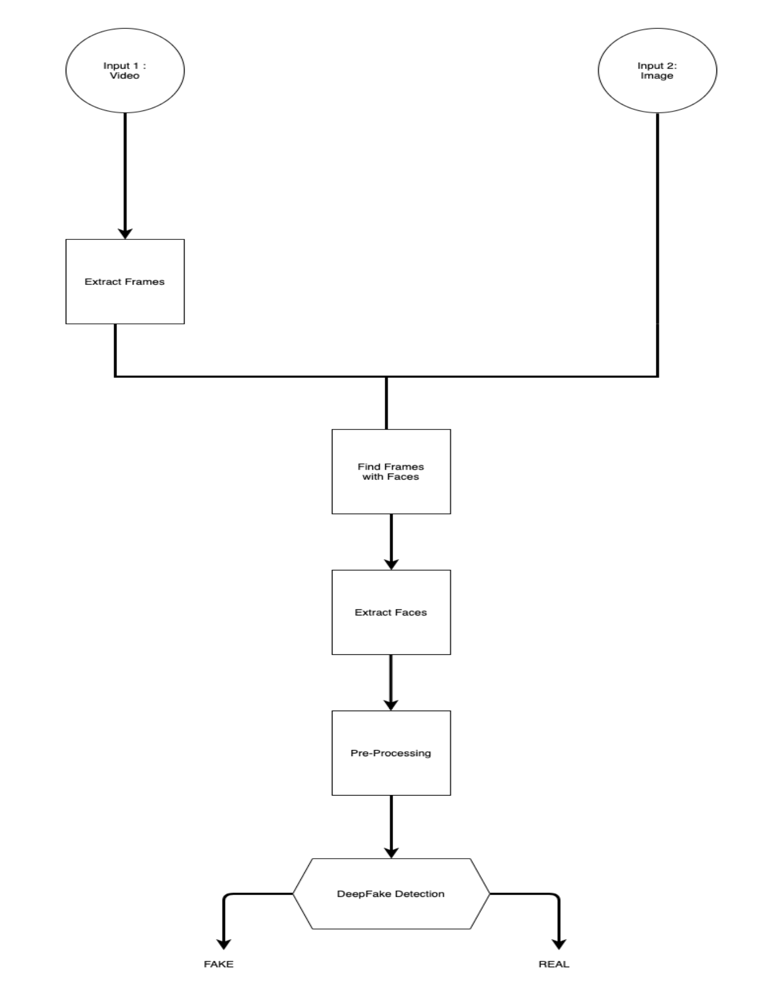

#Datset downloading

In [ ]:
#Changing Directory
%cd /content/drive/My\ Drive/Deep_Fake/Frames/

/content/drive/My Drive/Deep_Fake/Frames


In [ ]:
!pip install mtcnn


     |████████████████████████████████| 2.3MB 7.5MB/s 


In [ ]:
#Downloading Data using API
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"shiv1908","key":"57d703323bf265248b12dd33f72ba426"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp  kaggle.json ~/.kaggle
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge

In [ ]:
!unzip /content/drive/My\ Drive/Deep_Fake/Frames/train.zip

#Data Analyzation

In [ ]:
#Setting Path
TEST_PATH = '/content/drive/My Drive/Deep_Fake/test_videos/'
TRAIN_PATH = '/content/drive/My Drive/Deep_Fake/Frames/train/'
metadata = '/content/drive/My Drive/Deep_Fake/train_sample_videos/metadata.json'

In [ ]:
import glob
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
# load the filenames for train videos
train_fns = sorted(glob.glob(TRAIN_PATH + '*.mp4'))

# load the filenames for test videos
test_fns = sorted(glob.glob(TEST_PATH + '*.mp4'))
print(type(test_fns))
print('There are {} samples in the train set.'.format(len(train_fns)))
print('There are {} samples in the test set.'.format(len(test_fns)))

<class 'list'>
There are 400 samples in the train set.
There are 400 samples in the test set.


In [ ]:
meta = pd.read_json(metadata).transpose()
meta.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


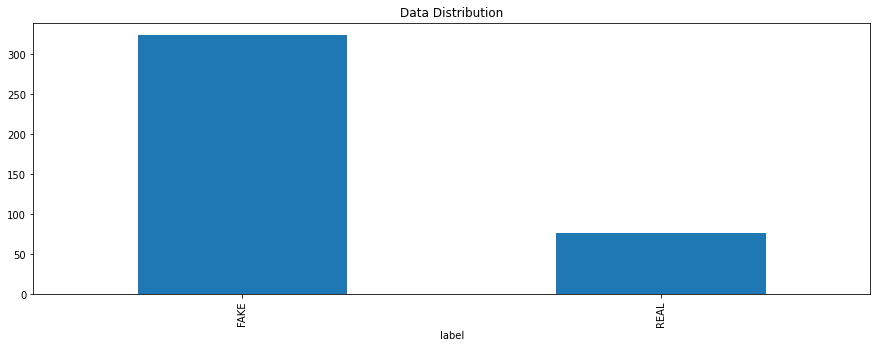

In [ ]:
#Checking division of data
meta.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Data Distribution')
plt.show()

In [ ]:
!pwd

/content


#Dataset Preparation -  Extracting Images from Videos

In [ ]:
import os
import cv2 
#Setting the directories to loop
dir = ["test","train"]
for dir1 in dir:
    for items in os.listdir("/content/drive/My Drive/Deep_Fake/test_videos/"):
        print(items)
        if(items.endswith('.mp4')):
            # define the name of the directory to be created
            path = "/content/drive/My Drive/Deep_Fake/Frames/" + str(dir1) + "/" + str(items) + "/"

            # define the access rights
            access_rights = 0o755

            if not os.path.exists(path):
             os.mkdir(path, access_rights)
            #except OSError:
             #  print ("Creation of the directory %s failed" % path)
            vidObj = cv2.VideoCapture("/content/drive/My Drive/Deep_Fake/test_videos/" + str(items)) 
  
            # Used as counter variable 
            count = 0
  
            # checks whether frames were extracted 
            success = 1
            k = 0 
            while (vidObj.isOpened and success != False): 
        
        #    vidObj object calls read 
            # function extract frames 
                success, image = vidObj.read() 
            #print(type(image))
            #print(image.shape)
            #take every 10th Frame
                if ( (k % 10) == 0 and success != False) :
                 # Saves the frames with frame-count 
                    #if ( image not None ):
                    if (type(image) != None):
                        cv2.imwrite(str(path) + "frame%d.jpg" % count, image) 
  
                        count += 1
                        k = k + 1

                else:
                    count += 1
                    k = k+1
                    continue
            print(count)
        vidObj.release() 
        cv2.destroyAllWindows() 


In [ ]:
!mkdir /content/drive/My\ Drive/Deep_Fake/BoxedImages/train

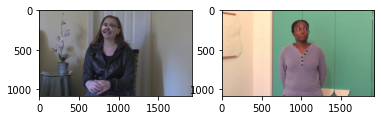

<Figure size 432x288 with 0 Axes>

In [ ]:
%matplotlib inline

#Plotting images to visualize
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image 
nimg = Image.open("/content/drive/MyDrive/Deep_Fake/Untitled Folder/Frames/train/awhmfnnjih.mp4/frame130.jpg")
pimg = Image.open("/content/drive/MyDrive/Deep_Fake/Untitled Folder/Frames/train/abarnvbtwb.mp4/frame130.jpg")




fig = plt.figure()

ax = fig.add_subplot(1, 2, 1)
imgplot = plt.imshow(nimg)


ax = fig.add_subplot(1, 2, 2)

imgplot = plt.imshow(pimg)






fig1 = plt.figure()





#Dataset Preparation - Detecting Face

## Detecting Facing and Comparting using two methods:</br>


1.   FaceNet
2.   DeepLearning Face recognition usign OpenCv



In [ ]:
# loading the keras facenet model
from keras.models import load_model

model = load_model('/content/drive/My Drive/Deep_Fake/model/facenet_keras.h5')
# summarize input and output shape
print(model.inputs)
print(model.outputs)

[<tf.Tensor 'input_1_1:0' shape=(None, 160, 160, 3) dtype=float32>]
[<tf.Tensor 'Bottleneck_BatchNorm/batchnorm_1/add_1:0' shape=(None, 128) dtype=float32>]


Populating the interactive namespace from numpy and matplotlib


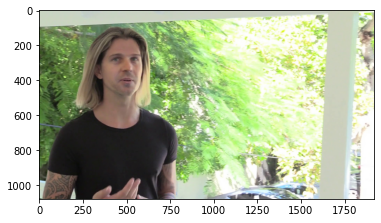

In [ ]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/drive/My Drive/Deep_Fake/Frames/frame10.jpg')
imgplot = plt.imshow(img)
plt.show()

Populating the interactive namespace from numpy and matplotlib


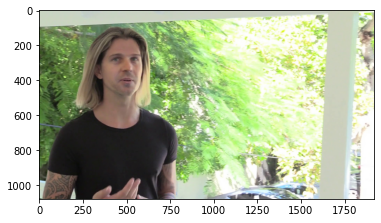

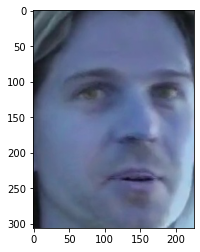

"\n%pylab inline\nimport matplotlib.pyplot as plt\nimport matplotlib.image as mpimg\nimg = mpimg.imread('/content/drive/My Drive/Deep_Fake/face.jpg')\nimgplot = plt.imshow(img)\nplt.show()"

In [ ]:
%pylab inline
#Plottin Images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/drive/My Drive/Deep_Fake/Frames/frame10.jpg')
imgFace = mpimg.imread('/content/drive/My Drive/Deep_Fake/face.jpg')
imgplot = plt.imshow(img)

plt.show()
imgplot = plt.imshow(imgFace)
plt.show()
'''
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/drive/My Drive/Deep_Fake/face.jpg')
imgplot = plt.imshow(img)
plt.show()'''

In [ ]:
!unzip /content/drive/My\ Drive/OpenCV/opencv-face-recognition-master.zip

Archive:  /content/drive/My Drive/OpenCV/opencv-face-recognition-master.zip
af3c961ce98f9cd9371412512f788a7c4e14c2ac
   creating: opencv-face-recognition-master/
  inflating: opencv-face-recognition-master/.gitignore  
  inflating: opencv-face-recognition-master/README.md  
   creating: opencv-face-recognition-master/devops/
  inflating: opencv-face-recognition-master/devops/Dockerfile  
  inflating: opencv-face-recognition-master/devops/docker-compose.yml  
   creating: opencv-face-recognition-master/devops/requirements/
  inflating: opencv-face-recognition-master/devops/requirements/requirement.txt  
   creating: opencv-face-recognition-master/src/
  inflating: opencv-face-recognition-master/src/.DS_Store  
   creating: opencv-face-recognition-master/src/.ipynb_checkpoints/
  inflating: opencv-face-recognition-master/src/.ipynb_checkpoints/Untitled-checkpoint.ipynb  
  inflating: opencv-face-recognition-master/src/Khanh10.jpg  
  inflating: opencv-face-recognition-master/src/Khanh12.

In [ ]:
import os , cv2, numpy as np
#Setting paths for opencv deep learning model
prototxt_path = os.path.join('/content/drive/My Drive/OpenCV/opencv-face-recognition-master/src/face_detection_model/deploy.prototxt')
caffemodel_path = os.path.join('/content/drive/My Drive/OpenCV/opencv-face-recognition-master/src/face_detection_model/weights.caffemodel')

# Read the model
model = cv2.dnn.readNetFromCaffe(prototxt_path, caffemodel_path)

In [ ]:
! mkdir /content/drive/My\ Drive/Deep_Fake/BoxedImages/train

In [ ]:
for folder in  ['train']:#os.listdir #("/content/drive/My Drive/Deep_Fake/Frames/"):
    count = 0 
    for imgFolder in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) + "/" ):
        access_rights = 0o755

        if not os.path.exists("/content/drive/My Drive/Deep_Fake/BoxedImages/" + str(folder) +"/" + str(imgFolder)):
             os.mkdir("/content/drive/My Drive/Deep_Fake/BoxedImages/" + str(folder) +"/" + str(imgFolder), access_rights)
        if ( imgFolder != ".DS_Store" ):
            for item in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) + "/" + str(imgFolder) +"/"):
                image = cv2.imread("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) +"/" + str(imgFolder) + "/" + str(item))

                (h, w) = image.shape[:2]
                blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))

                model.setInput(blob)
                detections = model.forward() 
                for i in range(0, detections.shape[2]):
                    box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                    (startX, startY, endX, endY) = box.astype("int")

                    confidence = detections[0, 0, i, 2]

                    # If confidence > 0.5, show box around face
                    if (confidence > 0.5):
                        cv2.rectangle(image, (startX, startY), (endX, endY), (255, 255, 255), 2)

                        cv2.imwrite("/content/drive/My Drive/Deep_Fake/BoxedImages/" + str(folder) + "/" + str(imgFolder) + "/img_" + str(count) + ".jpg", image)
                        print("Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/" + str(folder) + "/" + str(imgFolder) + "/")
                        count = count+1


Streaming output truncated to the last 5000 lines.
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/bbhpvrmbse.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/dakqwktlbi.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/dakqwktlbi.mp4/
Image  converted successfully /content/drive/My Drive/Deep_Fake/Frames/train/dakqwktlbi.mp4/
Image  converted su

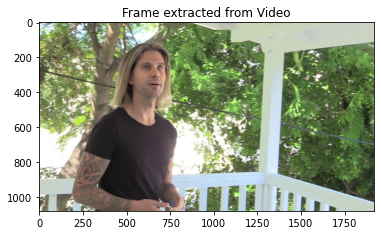

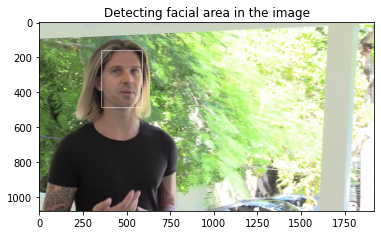

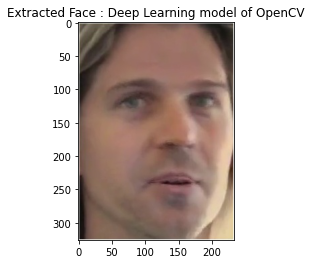

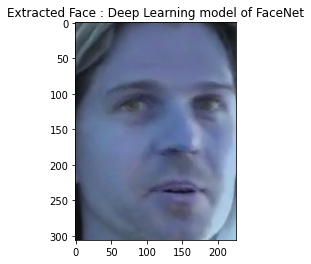

In [ ]:
#Plotting the images for comparison between facenet and Open Cv Deep Learning

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread('/content/drive/MyDrive/Deep_Fake/Untitled Folder/Frames/train/ahbweevwpv.mp4/frame210.jpg')
imgFace = mpimg.imread('/content/drive/My Drive/Deep_Fake/face.jpg')
imgBox = mpimg.imread('/content/drive/My Drive/Deep_Fake/box.jpg')
imgBoxFace = mpimg.imread("/content/drive/My Drive/Deep_Fake/boxFace.jpeg")
imgplot = plt.imshow(img)
plt.title("Frame extracted from Video")
plt.show()

imgplot=plt.imshow(imgBox)
plt.title("Detecting facial area in the image")
plt.show()




imgplot = plt.imshow(imgBoxFace)
plt.title("Extracted Face : Deep Learning model of OpenCV")
plt.show()

imgplot = plt.imshow(imgFace)
plt.title("Extracted Face : Deep Learning model of FaceNet")
plt.show()

In [ ]:
#Extracting face from each frame of video  and saving in the dataset
import glob
count = 0
for folder in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/"):
    for imgFolder in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) + "/"):
        access_rights = 0o755
        if ( imgFolder != ".DS_Store" ):
            if not os.path.exists("/content/drive/My Drive/Deep_Fake/Faces/" + str(folder) +"/" + str(imgFolder)):
                os.mkdir("/content/drive/My Drive/Deep_Fake/Faces/" + str(folder) +"/" + str(imgFolder), access_rights)
            for item in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) + "/" + str(imgFolder) + "/" ):
                    image = cv2.imread("/content/drive/My Drive/Deep_Fake/Frames/" + str(folder) +"/" + str(imgFolder) + "/" + str(item))

                    (h, w) = image.shape[:2]
                    blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))

                    model.setInput(blob)
                    detections = model.forward() 
                    for i in range(0, detections.shape[2]):
                        box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                        (startX, startY, endX, endY) = box.astype("int")

                        confidence = detections[0, 0, i, 2]

                        # If confidence > 0.5, show box around face
                        if (confidence > 0.5):
                            #cv2.rectangle(image, (startX, startY), (endX, endY), (255, 255, 255), 2)
                            face = image[startY:endY, startX:endX]
                            if face is not None and image is not None:
                                try: 
                                    cv2.imwrite("/content/drive/My Drive/Deep_Fake/Faces/" + str(folder) + "/" + str(imgFolder) + "/img_" + str(count) + ".jpg", face)
                                    print("Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/" + str(folder) + "/" + str(imgFolder) + "/", count)
                                    count = count+1
                                except:
                                    continue




Streaming output truncated to the last 5000 lines.
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13726
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13727
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13728
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13729
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13730
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13731
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/bbhpvrmbse.mp4/ 13732
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/dakqwktlbi.mp4/ 13733
Facial Image added successfully at  /content/drive/My Drive/Deep_Fake/Faces/train/dakqwktlbi.mp4/ 13734
Facial Image 

In [ ]:
m = 0
for folder in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/train/"):
    if (folder != ".DS_Store"): 
        for item in os.listdir("/content/drive/My Drive/Deep_Fake/Frames/train/" + str(folder) +  "/" ):
            print("/content/drive/My Drive/Deep_Fake/Frames/train/" + str(folder) +  "/" + str(item))
            m += 1

print(m)

Streaming output truncated to the last 5000 lines.
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame180.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame110.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame100.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame140.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame240.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame190.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame160.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame200.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame170.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame250.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame150.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/byijojkdba.mp4/frame270.jpg
/content/drive/My Drive/Deep_Fake/Frames/train/by

# Data Augmentation

In [ ]:
#As data is low, we will perfrom augmentaion for Training Data
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
import os
from PIL import Image
datagen = image.ImageDataGenerator(

    #Parameters for Data Augmentation
    #Rescalingn the images
    #rescale = 1./255,
    #Flipping the image
    horizontal_flip = True,
    #Slanting the image
    shear_range = 0.2,
    #Zooming 
    zoom_range = 0.2,
    
)

num = 0 

for item in os.listdir("/content/drive/My Drive/Deep_Fake/Faces/train/"):
    
    k = 0
    for g in os.listdir("/content/drive/My Drive/Deep_Fake/Faces/train/" + str(item) + "/"):
        if not os.path.exists("/content/drive/My Drive/Deep_Fake/Dataset/Train/" + str(item) ):
            os.mkdir("/content/drive/My Drive/Deep_Fake/Dataset/Train/" + str(item) ) 
        # PIL image
        img = load_img("/content/drive/My Drive/Deep_Fake/Faces/train/" + str(item) + "/" + str(g))  
        print("Reading : /content/drive/My Drive/Deep_Fake/Faces/train/" + str(item) + "/" + str(g))
        x = img_to_array(img)  
        # Numpy array 
        x = x.reshape((1,) + x.shape)  # Numpy array 

# .flow()  generates batches of randomly transformed images

        i = 0
        k = k + 1
        #saves the results to the `preview/` directory
        for batch in datagen.flow(x, batch_size=1,
                          save_to_dir="/content/drive/My Drive/Deep_Fake/Dataset/Train/" + str(item) + "/" , save_prefix="img" + str(k), save_format='jpeg'):
            i += 1

            print(num,"Writing : " + "/content/drive/My Drive/Deep_Fake/Dataset/Train/" + str(item) + "/" + "img" + str(k) +".jpeg")
            num += 1
            #convert one image into 40 images with different augmentation parameters
            k = k + 1
            if i > 40:
             break  

Streaming output truncated to the last 5000 lines.
1444182 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img796.jpeg
1444183 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img797.jpeg
Reading : /content/drive/My Drive/Deep_Fake/Faces/train/dlrsbscitn.mp4/img_49271.jpg
1444184 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img799.jpeg
1444185 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img800.jpeg
1444186 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img801.jpeg
1444187 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img802.jpeg
1444188 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img803.jpeg
1444189 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img804.jpeg
1444190 Writing : /content/drive/My Drive/Deep_Fake/Dataset/Train/dlrsbscitn.mp4/img805.jpeg
1444191 Writing : /content/

#Dataset Creation

In [ ]:
import pandas as pd
import os


In [ ]:
#Read the labels
df_metadata = pd.read_json("/content/drive/My Drive/Deep_Fake/train_sample_videos/metadata.json")

In [ ]:
#Checking the json file
df_metadata


,aagfhgtpmv.mp4,aapnvogymq.mp4,abarnvbtwb.mp4,abofeumbvv.mp4,abqwwspghj.mp4,acifjvzvpm.mp4,acqfdwsrhi.mp4,acxnxvbsxk.mp4,acxwigylke.mp4,aczrgyricp.mp4,adhsbajydo.mp4,adohikbdaz.mp4,adylbeequz.mp4,aelfnikyqj.mp4,aelzhcnwgf.mp4,aettqgevhz.mp4,aevrfsexku.mp4,afoovlsmtx.mp4,agdkmztvby.mp4,agqphdxmwt.mp4,agrmhtjdlk.mp4,ahbweevwpv.mp4,ahdbuwqxit.mp4,ahfazfbntc.mp4,ahqqqilsxt.mp4,aipfdnwpoo.mp4,ajqslcypsw.mp4,ajwpjhrbcv.mp4,aklqzsddfl.mp4,aknbdpmgua.mp4,aknmpoonls.mp4,akvmwkdyuv.mp4,akxoopqjqz.mp4,akzbnazxtz.mp4,aladcziidp.mp4,alaijyygdv.mp4,alninxcyhg.mp4,altziddtxi.mp4,alvgwypubw.mp4,amaivqofda.mp4,...,ehevsxtecd.mp4,ehfiekigla.mp4,ehieahnhte.mp4,ehtdtkmmli.mp4,eiriyukqqy.mp4,eivxffliio.mp4,eiwopxzjfn.mp4,eixwxvxbbn.mp4,ejkqesyvam.mp4,ekcrtigpab.mp4,ekhacizpah.mp4,ekkdjkirzq.mp4,elginszwtk.mp4,ellavthztb.mp4,elvvackpjh.mp4,emaalmsonj.mp4,emfbhytfhc.mp4,emgjphonqb.mp4,ensyyivobf.mp4,eoewqcpbgt.mp4,eprybmbpba.mp4,epymyyiblu.mp4,eqjscdagiv.mp4,eqnoqyfquo.mp4,eqvuznuwsa.mp4,erlvuvjsjf.mp4,erqgqacbqe.mp4,errocgcham.mp4,esckbnkkvb.mp4,esgftaficx.mp4,esnntzzajv.mp4,esxrvsgpvb.mp4,esyhwdfnxs.mp4,esyrimvzsa.mp4,etdcqxabww.mp4,etejaapnxh.mp4,etmcruaihe.mp4,etohcvnzbj.mp4,eudeqjhdfd.mp4,eukvucdetx.mp4
label,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,REAL,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,REAL,FAKE,REAL,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,...,FAKE,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,REAL,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,REAL,FAKE,REAL,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,FAKE,REAL,FAKE
split,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,...,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train
original,vudstovrck.mp4,jdubbvfswz.mp4,None,atvmxvwyns.mp4,qzimuostzz.mp4,kbvibjhfzo.mp4,ccfoszqabv.mp4,fjlyaizcwc.mp4,ffcwhpnpuw.mp4,slwkmefgde.mp4,fysyrqfguw.mp4,qjlhemtkxk.mp4,dlpoieqvfb.mp4,None,qzimuostzz.mp4,proiippuup.mp4,gxembgiarp.mp4,None,iufotyxgzb.mp4,aytzyidmgs.mp4,None,dkuayagnmc.mp4,jomvcqqars.mp4,sunqwnmlkx.mp4,None,ygdgwyqyut.mp4,None,bzythlfnhq.mp4,lyvlnqduqg.mp4,yxyhvdlrgk.mp4,swedbyuehz.mp4,xlbnmndmku.mp4,meawmsgiti.mp4,ppdpgwyjgm.mp4,fewcljwqkr.mp4,cppdvdejkc.mp4,tqhbgzfwsf.mp4,meawmsgiti.mp4,vcxckqbaya.mp4,xobhsemxmv.mp4,...,nzquxipbye.mp4,avmjormvsx.mp4,sasoxcqisz.mp4,None,ixuouyigxa.mp4,joeifeskbs.mp4,xzvrgckqkz.mp4,ywvlvpvroj.mp4,jwcsqxzdlv.mp4,None,egghxjjmfg.mp4,tivkmbqgwp.mp4,gipbyjfxfp.mp4,None,qhkqqfznrg.mp4,dzyuwjkjui.mp4,cprhtltsjp.mp4,ybjrqnqnno.mp4,lulmevqtla.mp4,gbqrgajyca.mp4,kuelhabsmz.mp4,svcnlasmeh.mp4,dbnygxtwek.mp4,None,cmbzllswnl.mp4,None,nvpluswotp.mp4,grnycmbdfu.mp4,gdfyzwykty.mp4,rrcsuwgpnd.mp4,ybetenmsye.mp4,gomwfvijiv.mp4,qeumxirsme.mp4,qzklcjjxdq.mp4,gipbyjfxfp.mp4,wtreibcmgm.mp4,afoovlsmtx.mp4,bdnaqemxmr.mp4,None,gjypopglvi.mp4


In [ ]:
df_metadata.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3 entries, label to original
Columns: 400 entries, aagfhgtpmv.mp4 to eukvucdetx.mp4
dtypes: object(400)
memory usage: 9.4+ KB


In [ ]:
df_metadata.describe()

,aagfhgtpmv.mp4,aapnvogymq.mp4,abarnvbtwb.mp4,abofeumbvv.mp4,abqwwspghj.mp4,acifjvzvpm.mp4,acqfdwsrhi.mp4,acxnxvbsxk.mp4,acxwigylke.mp4,aczrgyricp.mp4,adhsbajydo.mp4,adohikbdaz.mp4,adylbeequz.mp4,aelfnikyqj.mp4,aelzhcnwgf.mp4,aettqgevhz.mp4,aevrfsexku.mp4,afoovlsmtx.mp4,agdkmztvby.mp4,agqphdxmwt.mp4,agrmhtjdlk.mp4,ahbweevwpv.mp4,ahdbuwqxit.mp4,ahfazfbntc.mp4,ahqqqilsxt.mp4,aipfdnwpoo.mp4,ajqslcypsw.mp4,ajwpjhrbcv.mp4,aklqzsddfl.mp4,aknbdpmgua.mp4,aknmpoonls.mp4,akvmwkdyuv.mp4,akxoopqjqz.mp4,akzbnazxtz.mp4,aladcziidp.mp4,alaijyygdv.mp4,alninxcyhg.mp4,altziddtxi.mp4,alvgwypubw.mp4,amaivqofda.mp4,...,ehevsxtecd.mp4,ehfiekigla.mp4,ehieahnhte.mp4,ehtdtkmmli.mp4,eiriyukqqy.mp4,eivxffliio.mp4,eiwopxzjfn.mp4,eixwxvxbbn.mp4,ejkqesyvam.mp4,ekcrtigpab.mp4,ekhacizpah.mp4,ekkdjkirzq.mp4,elginszwtk.mp4,ellavthztb.mp4,elvvackpjh.mp4,emaalmsonj.mp4,emfbhytfhc.mp4,emgjphonqb.mp4,ensyyivobf.mp4,eoewqcpbgt.mp4,eprybmbpba.mp4,epymyyiblu.mp4,eqjscdagiv.mp4,eqnoqyfquo.mp4,eqvuznuwsa.mp4,erlvuvjsjf.mp4,erqgqacbqe.mp4,errocgcham.mp4,esckbnkkvb.mp4,esgftaficx.mp4,esnntzzajv.mp4,esxrvsgpvb.mp4,esyhwdfnxs.mp4,esyrimvzsa.mp4,etdcqxabww.mp4,etejaapnxh.mp4,etmcruaihe.mp4,etohcvnzbj.mp4,eudeqjhdfd.mp4,eukvucdetx.mp4
count,3,3,2,3,3,3,3,3,3,3,3,3,3,2,3,3,3,2,3,3,2,3,3,3,2,3,2,3,3,3,3,3,3,3,3,3,3,3,3,3,...,3,3,3,2,3,3,3,3,3,2,3,3,3,2,3,3,3,3,3,3,3,3,3,2,3,2,3,3,3,3,3,3,3,3,3,3,3,3,2,3
unique,3,3,2,3,3,3,3,3,3,3,3,3,3,2,3,3,3,2,3,3,2,3,3,3,2,3,2,3,3,3,3,3,3,3,3,3,3,3,3,3,...,3,3,3,2,3,3,3,3,3,2,3,3,3,2,3,3,3,3,3,3,3,3,3,2,3,2,3,3,3,3,3,3,3,3,3,3,3,3,2,3
top,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,...,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train,train
freq,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1


In [ ]:
#Counting the images
count = 0
img_count  = 0
for item in os.listdir("/content/drive/MyDrive/Deep_Fake/Faces/train/"):
    if (item != ".ipynb_checkpoints" or item != "metadata.json" or item != '.DS_Store'):
        try:
            print(item,df_metadata[str(item)][0],df_metadata[str(item)][1])
            count += 1
            print("dir",count)
            for img in os.listdir("/content/drive/MyDrive/Deep_Fake/Faces/train/" + str(item) + "/"):
                img_count += 1
                print("img",img_count)


        except:
            continue

        


In [ ]:
#Creating Dataset 
import os
import cv2
import numpy as np
import pandas as pd
df_metadata = pd.read_json("/content/drive/My Drive/Deep_Fake/train_sample_videos/metadata.json")
def get_dataset(img_folder):
    
    #making list to store data and it's respective label
    img_data_array=[]
    class_name=[]
    dir_count = 0
    img_count = 0 
    #Looping over Images of both the lables
    for dir1 in os.listdir(img_folder):
        dir_count += 1

        for file in os.listdir(os.path.join(img_folder, dir1)):
            print(os.path.join(img_folder, dir1))
            image_path= os.path.join(img_folder, dir1,  file)
            print(image_path)
            image= cv2.imread( image_path) #, cv2.COLOR_BGR2RGB)
            if image is None:
                continue
            img_count += 1
            print(image.shape)
            #print(image.mode)
            #Data Preprocessing - Resizing the Image
            image=cv2.resize(image, (50, 50) ,interpolation = cv2.INTER_AREA)
            #Adding the Image to List
            img_data_array.append(image)
            #Adding the respective label of the Image 
            
            #class_name.append(dir1)
            class_name.append(df_metadata[str(dir1)][0])
            #print(class_name)
            print(dir1,file,df_metadata[str(dir1)][0])
    #Returning Numpy array of Images, and Numpy array of respective labels 
    print("Dir:",dir_count,"Images:",img_count)       
    return np.array(img_data_array), np.array(class_name).reshape(len(class_name),1)

In [ ]:
X,y = get_dataset("/content/drive/MyDrive/Deep_Fake/Faces/train/")

In [ ]:
#Shuffle the data
from sklearn.utils import shuffle
X, y  = shuffle(X , y , random_state = 909)
print("Shuffled Successfully")

Shuffled Successfully


In [ ]:
print('Number of data points :', X.shape[0])
print('Shape of feature set X :', X.shape)


Number of data points : 35343
Shape of feature set X : (35343, 50, 50, 3)


In [ ]:
print('Shape of label set Y :', y.shape)

Shape of label set Y : (35343, 1)


In [ ]:
import csv
#Writing the CSV

with open("/content/drive/MyDrive/Deep_Fake/3DData50.csv", 'w') as f:
    csvwriter = csv.writer(f)
    csvwriter.writerows(X)


with open("/content/drive/MyDrive/Deep_Fake/3Dlabels50.csv", 'w') as f:
    csvwriter = csv.writer(f)
    csvwriter.writerows(y)

print("CSV Written")

CSV Written


In [ ]:
print(y)
print(X)

[['FAKE']
 ['FAKE']
 ['FAKE']
 ...
 ['FAKE']
 ['FAKE']
 ['FAKE']]
[[163 178 110 ... 150 166 103]
 [ 11  13  21 ...  29  55  81]
 [118 134 151 ...  56  59  87]
 ...
 [ 90 104 117 ...  20  20  30]
 [158 149 149 ...  31  32  38]
 [ 84 110 118 ... 121 153 179]]


In [ ]:
from google.colab import files
files.download('/content/drive/MyDrive/Deep_Fake/Data50_new.csv')
files.download("/content/drive/MyDrive/Deep_Fake/labels50_new.csv")

#Data Preprocessing

In [ ]:
import pandas as pd


In [ ]:
X = pd.read_csv("/content/drive/MyDrive/Deep_Fake/3DData50.csv")
Y = pd.read_csv("/content/drive/MyDrive/Deep_Fake/3Dlabels50.csv")

In [ ]:
print(X.shape)
print(Y.shape)

(35342, 50)
(35342, 1)


In [ ]:
Y

,FAKE
0,FAKE
1,FAKE
2,REAL
3,REAL
4,FAKE
...,...
35337,REAL
35338,FAKE
35339,FAKE
35340,FAKE


In [ ]:
#Change the string to number
Y = Y.replace({'FAKE': 0, 'REAL' : 1})

In [ ]:
Y

,0
0,0
1,0
2,0
3,0
4,0
...,...
35338,0
35339,0
35340,0
35341,0


#Reading the data 

In [ ]:
import pandas as pd
X = pd.read_csv("/content/drive/MyDrive/Deep_Fake/Data50.csv",header= None)
Y = pd.read_csv("/content/drive/MyDrive/Deep_Fake/labels50.csv", header = None)

In [ ]:
Y = Y.replace({'FAKE': 0, 'REAL' : 1})

In [ ]:
X = X.to_numpy()


In [ ]:
Y =Y.to_numpy()

In [ ]:
type(X)

numpy.ndarray

In [ ]:
X = X.reshape(len(X),50,50,3)
#Reshape to (height,width,depth,channels)

In [ ]:
Y = Y.reshape(len(Y),1)

In [ ]:
print(X)
print(Y)

[[[[135 143 156]
   [135 143 156]
   [137 144 158]
   ...
   [142 148 161]
   [142 148 161]
   [142 148 161]]

  [[135 143 156]
   [136 144 157]
   [137 145 158]
   ...
   [140 148 161]
   [142 148 161]
   [142 148 161]]

  [[135 142 155]
   [135 142 155]
   [137 143 157]
   ...
   [143 148 160]
   [142 148 161]
   [142 148 161]]

  ...

  [[ 24  28  41]
   [ 26  27  41]
   [ 25  29  41]
   ...
   [ 27  27  37]
   [ 21  22  31]
   [ 18  20  27]]

  [[ 26  27  41]
   [ 28  29  43]
   [ 30  32  46]
   ...
   [ 27  27  37]
   [ 22  23  33]
   [ 18  20  29]]

  [[ 29  29  43]
   [ 29  29  43]
   [ 32  33  47]
   ...
   [ 29  28  40]
   [ 25  26  37]
   [ 22  22  33]]]


 [[[138 146 161]
   [135 144 158]
   [130 139 151]
   ...
   [142 149 162]
   [142 150 163]
   [142 150 163]]

  [[138 145 160]
   [135 143 157]
   [130 139 152]
   ...
   [140 148 161]
   [141 149 162]
   [142 149 162]]

  [[138 146 159]
   [134 142 155]
   [129 138 151]
   ...
   [141 148 161]
   [141 148 161]
   [143 149

In [ ]:
print(X.shape)
print(Y.shape)

(35343, 50, 50, 3)
(35343, 1)


#Normalization


##Reading the data

In [ ]:
import pandas as pd
X = pd.read_csv("/content/drive/MyDrive/Deep_Fake/Data50.csv",header= None)
Y = pd.read_csv("/content/drive/MyDrive/Deep_Fake/labels50.csv", header = None)

In [ ]:
Y = Y.replace({'FAKE': 0, 'REAL' : 1})

###Normalization Method : 1 Min-Max Normalization</br>
Normalization Method 2 : Normal Scaling(/255) is directly applied on trainX and trainY

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
#MinMax Normalizing
X = scaler.fit_transform(X)

In [ ]:
#X = X.to_numpy()


In [ ]:
Y =Y.to_numpy()

In [ ]:
type(X)

numpy.ndarray

In [ ]:
X = X.reshape(len(X),50,50,3)


In [ ]:
Y = Y.reshape(len(Y),1)

In [ ]:
print(X)
print(Y)

[[[[0.52941176 0.55378486 0.604     ]
   [0.52941176 0.55378486 0.604     ]
   [0.5372549  0.55952381 0.612     ]
   ...
   [0.56349206 0.5770751  0.628     ]
   [0.568      0.5770751  0.62549801]
   [0.55686275 0.57539683 0.62549801]]

  [[0.52941176 0.55555556 0.604     ]
   [0.53333333 0.55952381 0.608     ]
   [0.5372549  0.56349206 0.61354582]
   ...
   [0.55776892 0.57874016 0.628     ]
   [0.56573705 0.57874016 0.62549801]
   [0.55686275 0.5770751  0.62549801]]

  [[0.52941176 0.55335968 0.6       ]
   [0.52941176 0.55335968 0.6       ]
   [0.5372549  0.55555556 0.60956175]
   ...
   [0.572      0.57539683 0.624     ]
   [0.56349206 0.57539683 0.62549801]
   [0.55686275 0.57539683 0.62549801]]

  ...

  [[0.09448819 0.1027668  0.14741036]
   [0.1027668  0.10588235 0.15079365]
   [0.0984252  0.11023622 0.1541502 ]
   ...
   [0.10843373 0.10588235 0.14173228]
   [0.08433735 0.08627451 0.11811024]
   [0.07058824 0.07843137 0.1023622 ]]

  [[0.09881423 0.09881423 0.14741036]
   [0.1

In [ ]:
print(X.shape)
print(Y.shape)

(35343, 50, 50, 3)
(35343, 1)


# CNN Architectures

## Import

In [ ]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import InputLayer
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


##LeNet

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib


class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 19ms/step - loss: 0.5205 - accuracy: 0.7804 - val_loss: 0.4828 - val_accuracy: 0.7739
Epoch 2/20
133/133 [==============================] - 2s 17ms/step - loss: 0.3849 - accuracy: 0.8216 - val_loss: 0.3149 - val_accuracy: 0.8628
Epoch 3/20
133/133 [==============================] - 2s 18ms/step - loss: 0.2451 - accuracy: 0.8935 - val_loss: 0.1803 - val_accuracy: 0.9217
Epoch 4/20
133/133 [==============================] - 2s 18ms/step - loss: 0.1659 - accuracy: 0.9299 - val_loss: 0.1616 - val_accuracy: 0.9328
Epoch 5/20
133/133 [==============================] - 2s 17ms/step - loss: 0.1288 - accuracy: 0.9468 - val_loss: 0.1370 - val_accuracy: 0.9432
Epoch 6/20
133/133 [==============================] - 2s 17ms/step - loss: 0.1068 - accuracy: 0.9571 - val_loss: 0.1113 - val_accuracy: 0.9568
Epoch 7/20
133/133 [==============================] - 2s 18ms/step - loss: 0.0804 - a

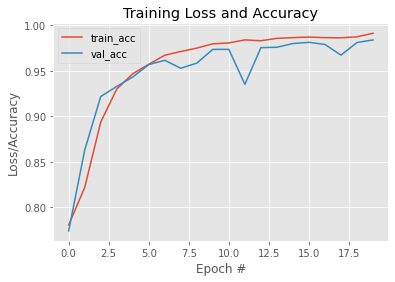

In [ ]:


from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())


#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

## ALexNet

In [ ]:
#This architecture is created using the same method as above

class AlexNet:
    def build(height, width, depth, classes, lambda2 = 0.0002):
        model = Sequential(name = 'AlexNet')
        
        model.add(Conv2D(96, (11, 11), strides = (1, 1), input_shape = (height, width, depth),
                         padding='same', kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size = (3,3), strides = (2,2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(256, (5, 5), padding = 'same', kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Conv2D(384, (3, 3), padding = 'same', kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(384, (3, 3), padding = 'same', kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        model.add(Conv2D(256, (3, 3), padding = 'same', kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size = (3, 3), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        model.add(Dense(4096, kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(4096, kernel_regularizer = l2(lambda2)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        model.add(Dense(classes, kernel_regularizer = l2(lambda2)))
        model.add(Activation('softmax'))
        
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 15s 116ms/step - loss: 3.1703 - accuracy: 0.7145 - val_loss: 2.7273 - val_accuracy: 0.7776
Epoch 2/20
133/133 [==============================] - 15s 114ms/step - loss: 2.4329 - accuracy: 0.7841 - val_loss: 2.5487 - val_accuracy: 0.4518
Epoch 3/20
133/133 [==============================] - 15s 115ms/step - loss: 2.0302 - accuracy: 0.8085 - val_loss: 1.8623 - val_accuracy: 0.8052
Epoch 4/20
133/133 [==============================] - 15s 115ms/step - loss: 1.7310 - accuracy: 0.8223 - val_loss: 1.9154 - val_accuracy: 0.7305
Epoch 5/20
133/133 [==============================] - 15s 115ms/step - loss: 1.4826 - accuracy: 0.8352 - val_loss: 1.5815 - val_accuracy: 0.7397
Epoch 6/20
133/133 [==============================] - 15s 116ms/step - loss: 1.2521 - accuracy: 0.8496 - val_loss: 1.9233 - val_accuracy: 0.7713
Epoch 7/20
133/133 [==============================] - 15s 116ms/step - lo

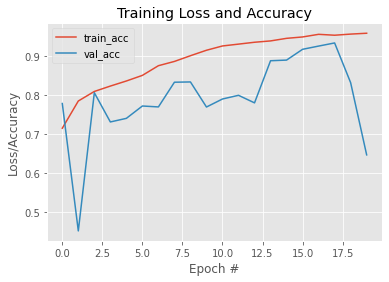

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_alexnet = AlexNet.build(50, 50, 3, 2)
#Compile the model
model_alexnet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_alexnet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_alexnet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

##VGG 16

In [ ]:
class VGGNet16:
    def build(height, width, depth, classes):
        model = Sequential(name = 'VGGNet16')
        
        # conv 1
        model.add(Conv2D(64, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 2
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 3
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 4
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 5
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 6
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 7
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 8
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 9
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 10
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 11
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 12
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 13
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        # fc 14
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 15
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 16
        model.add(Dense(1000))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 20s 152ms/step - loss: 0.7711 - accuracy: 0.7178 - val_loss: 0.6228 - val_accuracy: 0.6822
Epoch 2/20
133/133 [==============================] - 19s 145ms/step - loss: 0.4899 - accuracy: 0.8021 - val_loss: 0.5675 - val_accuracy: 0.7550
Epoch 3/20
133/133 [==============================] - 19s 146ms/step - loss: 0.4075 - accuracy: 0.8368 - val_loss: 0.6162 - val_accuracy: 0.7666
Epoch 4/20
133/133 [==============================] - 19s 147ms/step - loss: 0.3123 - accuracy: 0.8751 - val_loss: 0.9958 - val_accuracy: 0.7515
Epoch 5/20
133/133 [==============================] - 20s 147ms/step - loss: 0.2357 - accuracy: 0.9053 - val_loss: 0.4034 - val_accuracy: 0.8588
Epoch 6/20
133/133 [==============================] - 20s 149ms/step - loss: 0.1894 - accuracy: 0.9251 - val_loss: 0.2099 - val_accuracy: 0.9170
Epoch 7/20
133/133 [==============================] - 20s 149ms/step - lo

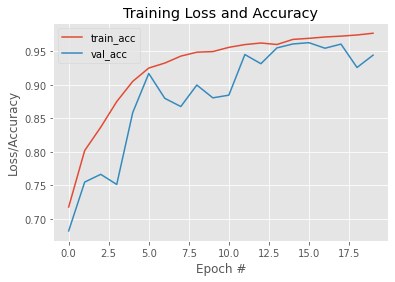

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)





#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_vgg16 = VGGNet16.build(50, 50, 3, 2)
#Compile the model
model_vgg16.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_vgg16.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Performance Measurement.
print('\n Test accuracy')
predictedY = model_vgg16.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

##VGG 19

In [ ]:
class VGGNet19:
    def build(height, width, depth, classes):
        model = Sequential(name = 'VGGNet19')
        
        # conv 1
        model.add(Conv2D(64, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 2
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 3
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 4
        model.add(Conv2D(128, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 5
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 6
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 7
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 8
        model.add(Conv2D(256, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 9
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 10
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 11
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 12
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # conv 13
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 14
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 15
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # conv 16
        model.add(Conv2D(512, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # pool
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        model.add(Flatten())
        
        # fc 17
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 18
        model.add(Dense(4096))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fc 19
        model.add(Dense(1000))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 22s 165ms/step - loss: 0.7414 - accuracy: 0.7178 - val_loss: 1.0404 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 22s 164ms/step - loss: 0.4557 - accuracy: 0.8134 - val_loss: 1.0462 - val_accuracy: 0.7713
Epoch 3/20
133/133 [==============================] - 22s 167ms/step - loss: 0.3516 - accuracy: 0.8585 - val_loss: 0.6954 - val_accuracy: 0.7713
Epoch 4/20
133/133 [==============================] - 22s 168ms/step - loss: 0.2595 - accuracy: 0.8996 - val_loss: 0.6818 - val_accuracy: 0.7722
Epoch 5/20
133/133 [==============================] - 23s 170ms/step - loss: 0.2113 - accuracy: 0.9147 - val_loss: 0.3684 - val_accuracy: 0.8470
Epoch 6/20
133/133 [==============================] - 23s 172ms/step - loss: 0.1892 - accuracy: 0.9264 - val_loss: 0.2693 - val_accuracy: 0.9116
Epoch 7/20
133/133 [==============================] - 23s 172ms/step - lo

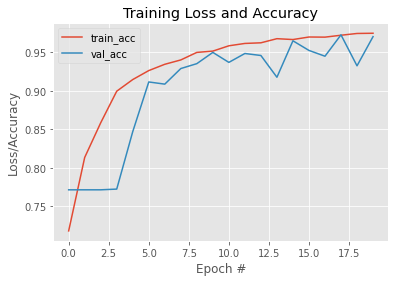

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



#((trainX, trainY), (testX, testY)) = cifar10.load_data()


#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_vgg19 = VGGNet19.build(50, 50, 3, 2)
#Compile the model
model_vgg19.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_vgg19.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_vgg19.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

## Resnet

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils

In [ ]:
class ResNet:
    def residual_module(data, K, stride, channelsDim, reduce = False, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9):
        shortcut = data
        
        # 1x1 CONVs
        bn1 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(data)
        act1 = Activation('relu')(bn1)
        conv1 = Conv2D(int(K * 0.25), (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act1)
        
        # 3x3 CONVs
        bn2 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv1)
        act2 = Activation('relu')(bn2)
        conv2 = Conv2D(int(K * 0.25), (3, 3), strides = stride, padding = 'same', use_bias = False, kernel_regularizer = l2(reg))(act2)
        
        # 1x1 CONVs
        bn3 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv2)
        act3 = Activation('relu')(bn3)
        conv3 = Conv2D(K, (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act3)
        
        # if we reduce the spatial size, apply a CONV layer to the shortcut
        if reduce:
            shortcut = Conv2D(K, (1, 1), strides = stride, use_bias = False, kernel_regularizer = l2(reg))(act1)
            
        # add the shortcut and the final CONV
        x = add([conv3, shortcut])
        
        return x
    
    def build(width, height, depth, classes, stages, filters, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9, dataset='cifar'):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == 'channels_first':
            inputShape = (depth, height, width)
            channelsDim = 1
            
        # set the input and apply BN
        inputs = Input(shape = inputShape)
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(inputs)
        
        if dataset == 'cifar':
            # apply a single CONV layer
            x = Conv2D(filters[0], (3, 3), use_bias = False, padding = 'same',
                       kernel_regularizer = l2(reg))(x)
        
        # loop over the number of stages
        for counter in range(0, len(stages)):
            # initialize the stride
            if counter == 0:
                stride = (1, 1)
            else:
                stride = (2, 2)
                    
            # apply a residual module to reduce the spatial dimension of the image volume
            x = ResNet.residual_module(x, filters[counter + 1], stride, channelsDim, reduce = True, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
            
            # loop over the number of layers in the current stage
            for j in range(0, stages[counter] - 1):
                # apply a residual module
                x = ResNet.residual_module(x, filters[counter + 1], (1, 1), channelsDim, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
                    
        # apply BN -> ACT -> POOL
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(x)
        x = Activation('relu')(x)
        x = AveragePooling2D((8, 8))(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes, kernel_regularizer = l2(reg))(x)
        x = Activation('softmax')(x)
        
        # create the model
        model = Model(inputs, x, name = 'ResNet')
        
        # return the model
        return model

In [ ]:
#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_166 (BatchN (None, 50, 50, 3)    12          input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_170 (Conv2D)             (None, 50, 50, 64)   1728        batch_normalization_166[0][0]    
__________________________________________________________________________________________________
batch_normalization_167 (BatchN (None, 50, 50, 64)   256         conv2d_170[0][0]                 
___________________________________________________________________

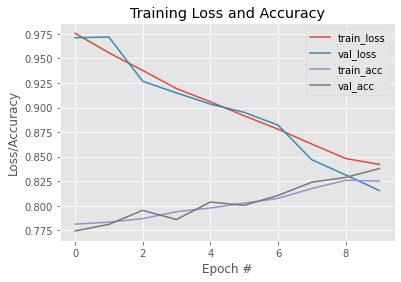

In [ ]:

#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)

trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 10
print("[INFO] compiling model...")
opt = SGD(lr = 0.01)
model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
              steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

##MiniVGGNet

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils

In [ ]:
class MiniVGGNet:
    def build(height, width, depth, classes):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'MiniVGGNet')
                
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # flatten the activations from a square to a vector
        model.add(Flatten())
        
        # fully-connected layer
        model.add(Dense(512))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fully-connected layer with softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

In [ ]:

(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


[INFO] compiling model...
Model: "MiniVGGNet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 50, 50, 32)        896       
_________________________________________________________________
activation (Activation)      (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 50, 50, 32)        128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 50, 50, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (

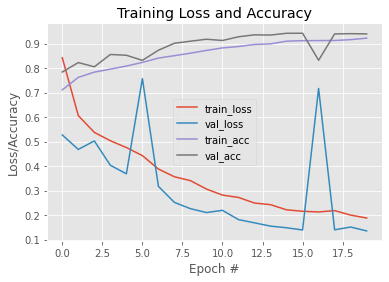

In [ ]:

trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 20
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = MiniVGGNet.build(50, 50, 3, 2)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])


# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

# Modern CNN - MesoNet

##Imports 

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import InputLayer
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Reshape, Concatenate, LeakyReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


## MesoNet - Meso4 Architecture

In [ ]:
class Meso4:
    def build(height, width, depth, classes):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'Meso4') 
        
        #x = (height, width, depth)
        '''x = Input(shape = (height,
                           width,
                           depth))'''
        
        model.add(Conv2D(8, (3, 3), padding='valid', activation = 'relu',input_shape = (height, width, depth)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='valid'))
        
        model.add(Conv2D(8, (5, 5), padding='valid', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='valid', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='valid', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(4, 4), padding='valid'))
        
        model.add(Flatten())
        model.add(Dropout(0.5))
        model.add(Dense(16))
        model.add(LeakyReLU(alpha=0.1))
        model.add(Dropout(0.5))
        model.add(Dense(classes, activation = 'sigmoid'))

        return model

[INFO] compiling model...
Model: "Meso4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_22 (Conv2D)           (None, 50, 50, 8)         224       
_________________________________________________________________
batch_normalization_21 (Batc (None, 50, 50, 8)         32        
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 25, 25, 8)         0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 25, 25, 8)         1608      
_________________________________________________________________
batch_normalization_22 (Batc (None, 25, 25, 8)         32        
_________________________________________________________________
max_pooling2d_21 (MaxPooling (None, 13, 13, 8)         0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None,

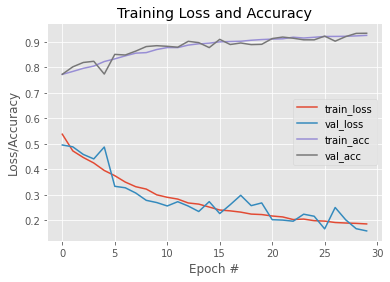

In [ ]:
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 30
#print("Optimizer : ", opt)
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = Meso4.build(50, 50, 3, 2)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])


# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))


# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

#Tunning Hyperparameters

## Pick the best performing architectures from above experiements.</br> Tune one by one all the paramerters and keep selecting the best performing value of the hyperparameters from previous results while checking for loss, acc, underfitting, overfitting and could more epochs have resulted in better accuracy?

##LeNet

###Normalization

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib


class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


#### Normalization 1

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 19ms/step - loss: 0.5205 - accuracy: 0.7804 - val_loss: 0.4828 - val_accuracy: 0.7739
Epoch 2/20
133/133 [==============================] - 2s 17ms/step - loss: 0.3849 - accuracy: 0.8216 - val_loss: 0.3149 - val_accuracy: 0.8628
Epoch 3/20
133/133 [==============================] - 2s 18ms/step - loss: 0.2451 - accuracy: 0.8935 - val_loss: 0.1803 - val_accuracy: 0.9217
Epoch 4/20
133/133 [==============================] - 2s 18ms/step - loss: 0.1659 - accuracy: 0.9299 - val_loss: 0.1616 - val_accuracy: 0.9328
Epoch 5/20
133/133 [==============================] - 2s 17ms/step - loss: 0.1288 - accuracy: 0.9468 - val_loss: 0.1370 - val_accuracy: 0.9432
Epoch 6/20
133/133 [==============================] - 2s 17ms/step - loss: 0.1068 - accuracy: 0.9571 - val_loss: 0.1113 - val_accuracy: 0.9568
Epoch 7/20
133/133 [==============================] - 2s 18ms/step - loss: 0.0804 - a

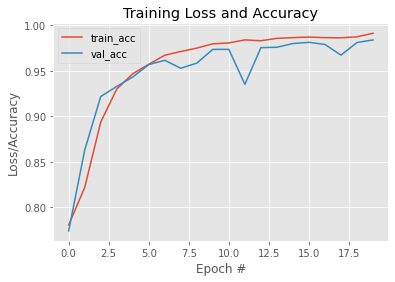

In [ ]:


from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

#### Normalization method 2

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 219s 2s/step - loss: 0.5174 - accuracy: 0.7788 - val_loss: 0.4429 - val_accuracy: 0.7814
Epoch 2/20
133/133 [==============================] - 223s 2s/step - loss: 0.3777 - accuracy: 0.8294 - val_loss: 0.3251 - val_accuracy: 0.8569
Epoch 3/20
133/133 [==============================] - 225s 2s/step - loss: 0.2688 - accuracy: 0.8829 - val_loss: 0.2532 - val_accuracy: 0.8911
Epoch 4/20
133/133 [==============================] - 222s 2s/step - loss: 0.1947 - accuracy: 0.9193 - val_loss: 0.1804 - val_accuracy: 0.9257
Epoch 5/20
133/133 [==============================] - 225s 2s/step - loss: 0.1338 - accuracy: 0.9464 - val_loss: 0.1446 - val_accuracy: 0.9389
Epoch 6/20
133/133 [==============================] - 223s 2s/step - loss: 0.1093 - accuracy: 0.9568 - val_loss: 0.1268 - val_accuracy: 0.9484
Epoch 7/20
133/133 [==============================] - 219s 2s/step - loss: 0.0857 - a

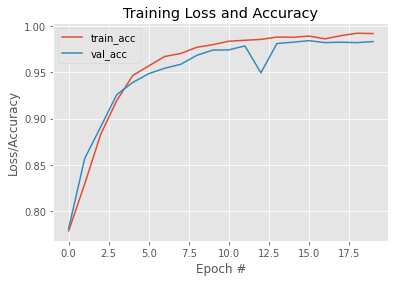

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
%cd /content/drive/MyDrive/Deep_Fake

/content/drive/MyDrive/Deep_Fake


In [ ]:
!rm -rf /content/drive/MyDrive/Deep_Fake/model/LeNet

###Regularization


#### Architecture 1 - Kernel Regularizer L1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, reg ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(reg)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


#Y = cifarData[0][1][:10000]
print(Y.shape)


for r in [0.1,0.001,0.00001,0.00000001]:
    #Spliting the train ,test  and Validation data
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



    #((trainX, trainY), (testX, testY)) = cifar10.load_data()


    #Scaling the data
    trainX = trainX.astype('float32')/255.0
    testX = testX.astype('float32')/255.0
    
    #Conversion into categorical format
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)

    print("L1 :", r)
    #Building the LeNet
    model_lenet = LeNet.build(50, 50, 3, 2, reg =r)
    #Compile the model
    model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
    print(model_lenet.summary())

    #Saving the model to be used further
    #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
    #Performance Measurement.
    print('\n Test accuracy')
    predictedY = model_lenet.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY))

    '''# plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()'''

    model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Kernel_L1/model_LeNetL1="+str(r), overwrite = True)

(35343, 50, 50, 3)
(35343, 1)
L1 : 0.1
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 5s 37ms/step - loss: 61.3370 - accuracy: 0.7808 - val_loss: 3.7981 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 5s 34ms/step - loss: 3.7303 - accuracy: 0.7838 - val_loss: 3.7254 - val_accuracy: 0.7713
Epoch 3/20
133/133 [==============================] - 5s 34ms/step - loss: 3.7196 - accuracy: 0.7838 - val_loss: 3.6979 - val_accuracy: 0.7713
Epoch 4/20
133/133 [==============================] - 5s 35ms/step - loss: 3.7189 - accuracy: 0.7838 - val_loss: 3.7189 - val_accuracy: 0.7713
Epoch 5/20
133/133 [==============================] - 5s 35ms/step - loss: 3.7163 - accuracy: 0.7838 - val_loss: 3.7260 - val_accuracy: 0.7713
Epoch 6/20
133/133 [==============================] - 5s 34ms/step - loss: 3.7150 - accuracy: 0.7838 - val_loss: 3.7709 - val_accuracy: 0.7713
Epoch 7/20
133/133 [==============================] - 5s 35ms/step - loss: 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.77      1.00      0.87      5462
           1       0.00      0.00      0.00      1607

    accuracy                           0.77      7069
   macro avg       0.39      0.50      0.44      7069
weighted avg       0.60      0.77      0.67      7069

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Deep_Fake/model/LeNet/Kernel_L1/model_LeNetL1=0.1/assets
L1 : 0.001
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 5s 38ms/step - loss: 1.5938 - accuracy: 0.7840 - val_loss: 0.7057 - val_accuracy: 0.7715
Epoch 2/20
133/133 [==============================] - 5s 35ms/step - loss: 0.5985 - accuracy: 0.7899 - val_loss: 0.5480 - val_accuracy: 0.7883
Epoch 3/20
133/133 [==============================] - 5s 35ms/step - loss: 0.5043 - accuracy: 0.8062 - val_loss: 0.4713 - val_accuracy: 0.8151
Epoch 4/20
133/133 [==============================] - 5s 35ms/step - loss: 0.4450 - accurac

#### Architecture 2 - Kernel Regularizer L2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, reg ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l2(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l2(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l2(reg)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)


for r in [0.1,0.001,0.00001,0.00000001]:
    #Spliting the train ,test  and Validation data
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



    #((trainX, trainY), (testX, testY)) = cifar10.load_data()


    #Scaling the data
    trainX = trainX.astype('float32')/255.0
    testX = testX.astype('float32')/255.0
    
    #Conversion into categorical format
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)

    print("L2 :", r)
    #Building the LeNet
    model_lenet = LeNet.build(50, 50, 3, 2, reg =r)
    #Compile the model
    model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
    print(model_lenet.summary())

    #Saving the model to be used further
    #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
    #Performance Measurement.
    print('\n Test accuracy')
    predictedY = model_lenet.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY))

    '''# plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()'''

    model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Kernel_L2/model_LeNetL2="+str(r), overwrite= True)

(35343, 50, 50, 3)
(35343, 1)
L2 : 0.1
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 5s 40ms/step - loss: 1.8889 - accuracy: 0.7803 - val_loss: 0.5456 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 5s 35ms/step - loss: 0.5102 - accuracy: 0.7846 - val_loss: 0.5105 - val_accuracy: 0.7718
Epoch 3/20
133/133 [==============================] - 5s 34ms/step - loss: 0.4938 - accuracy: 0.7870 - val_loss: 0.4993 - val_accuracy: 0.7767
Epoch 4/20
133/133 [==============================] - 5s 35ms/step - loss: 0.4889 - accuracy: 0.7850 - val_loss: 0.4882 - val_accuracy: 0.7805
Epoch 5/20
133/133 [==============================] - 5s 34ms/step - loss: 0.4788 - accuracy: 0.7884 - val_loss: 0.4858 - val_accuracy: 0.7835
Epoch 6/20
133/133 [==============================] - 5s 35ms/step - loss: 0.4775 - accuracy: 0.7891 - val_loss: 0.4842 - val_accuracy: 0.7840
Epoch 7/20
133/133 [==============================] - 5s 34ms/step - loss: 0

#### Architecture 3 - Activity Regularizer L1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, reg ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), activity_regularizer = l1(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', activity_regularizer = l1(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', activity_regularizer = l1(reg)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)

print(Y.shape)


for r in [0.1,0.001,0.00001,0.00000001]:
    #Spliting the train ,test  and Validation data
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



    #((trainX, trainY), (testX, testY)) = cifar10.load_data()


    #Scaling the data
    trainX = trainX.astype('float32')/255.0
    testX = testX.astype('float32')/255.0
    
    #Conversion into categorical format
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)

    print("L1 :", r)
    #Building the LeNet
    model_lenet = LeNet.build(50, 50, 3, 2, reg =r)
    #Compile the model
    model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
    print(model_lenet.summary())

    #Saving the model to be used further
    #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
    #Performance Measurement.
    print('\n Test accuracy')
    predictedY = model_lenet.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY))

    '''# plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()'''

    model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Kernel_L1/model_LeNetL2="+str(r), overwrite= True)

(35343, 50, 50, 3)
(35343, 1)
L1 : 0.1
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 7s 51ms/step - loss: 184.5110 - accuracy: 0.7834 - val_loss: 74.6992 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 6s 46ms/step - loss: 54.5877 - accuracy: 0.7857 - val_loss: 40.6465 - val_accuracy: 0.7746
Epoch 3/20
133/133 [==============================] - 6s 46ms/step - loss: 34.0640 - accuracy: 0.7878 - val_loss: 28.3331 - val_accuracy: 0.7824
Epoch 4/20
133/133 [==============================] - 6s 46ms/step - loss: 26.3619 - accuracy: 0.7907 - val_loss: 23.9041 - val_accuracy: 0.7776
Epoch 5/20
133/133 [==============================] - 6s 46ms/step - loss: 22.0136 - accuracy: 0.7960 - val_loss: 20.5814 - val_accuracy: 0.7732
Epoch 6/20
133/133 [==============================] - 6s 46ms/step - loss: 18.9849 - accuracy: 0.8027 - val_loss: 16.8335 - val_accuracy: 0.7956
Epoch 7/20
133/133 [==============================] - 6s 46ms/s

####Architecture 4 - Activity Regularizer L2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, reg=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), activity_regularizer = l2(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', activity_regularizer = l2(reg)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', activity_regularizer = l2(reg)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)


for r in [0.1,0.001,0.00001,0.00000001]:
    #Spliting the train ,test  and Validation data
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)





    #Scaling the data
    trainX = trainX.astype('float32')/255.0
    testX = testX.astype('float32')/255.0
    
    #Conversion into categorical format
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)

    print("L2 :", r)
    #Building the LeNet
    model_lenet = LeNet.build(50, 50, 3, 2, reg =r)
    #Compile the model
    model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
    print(model_lenet.summary())

    #Saving the model to be used further
    #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
    #Performance Measurement.
    print('\n Test accuracy')
    predictedY = model_lenet.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY))

    '''# plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
    #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()'''

    model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Activity_L2/model_LeNetL2="+str(r), overwrite= True)

(35343, 50, 50, 3)
(35343, 1)
L2 : 0.1
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 6s 48ms/step - loss: 13.8816 - accuracy: 0.7869 - val_loss: 3.3475 - val_accuracy: 0.8050
Epoch 2/20
133/133 [==============================] - 6s 48ms/step - loss: 2.4036 - accuracy: 0.8545 - val_loss: 1.7600 - val_accuracy: 0.8833
Epoch 3/20
133/133 [==============================] - 6s 46ms/step - loss: 1.4166 - accuracy: 0.9124 - val_loss: 1.1432 - val_accuracy: 0.9300
Epoch 4/20
133/133 [==============================] - 6s 46ms/step - loss: 0.9501 - accuracy: 0.9490 - val_loss: 0.8136 - val_accuracy: 0.9493
Epoch 5/20
133/133 [==============================] - 6s 46ms/step - loss: 0.7159 - accuracy: 0.9622 - val_loss: 0.8355 - val_accuracy: 0.8946
Epoch 6/20
133/133 [==============================] - 6s 47ms/step - loss: 0.6067 - accuracy: 0.9654 - val_loss: 0.6414 - val_accuracy: 0.9293
Epoch 7/20
133/133 [==============================] - 6s 46ms/step - loss: 

#### Architecture 5 - Kernel Regularizer L1 and Activity Regularizer L2

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


In [ ]:
#Selecting the best values from above and trying combinations

from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)

print(Y.shape)


for r in [0.00000001,0.000000001,0.0000000001]:
    for g in [0.0001,0.00001,0.000001,0.0000001]:
    #Spliting the train ,test  and Validation data
        (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
        (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



       


        #Scaling the data
        trainX = trainX.astype('float32')/255.0
        testX = testX.astype('float32')/255.0
        
        #Conversion into categorical format
        trainY = to_categorical(trainY, 2)
        testY = to_categorical(testY, 2)

        print("L1 :", r,"L2:",g)
        #Building the LeNet
        model_lenet = LeNet.build(50, 50, 3, 2, lambda1 =r, lambda2 = g)
        #Compile the model
        model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

        print("[INFO] training network...")
        maxIt = 20
        H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
        print(model_lenet.summary())

        #Saving the model to be used further
        #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
        #Performance Measurement.
        print('\n Test accuracy')
        predictedY = model_lenet.predict(testX)
        predictedY = predictedY.argmax(axis=1)
        testY = testY.argmax(axis=1)
        print(classification_report(testY, predictedY))

        '''# plot the training loss and accuracy
        plt.style.use("ggplot")
        plt.figure()
        #plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
        #plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
        plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
        plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
        plt.title("Training Loss and Accuracy")
        plt.xlabel("Epoch #")
        plt.ylabel("Loss/Accuracy")
        plt.legend()'''

        model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Activity_Kernel/model_LeNetL1="+str(r)+"L2="+str(g), overwrite= True)

(35343, 50, 50, 3)
(35343, 1)
L1 : 1e-08 L2: 0.0001
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 7s 49ms/step - loss: 0.4615 - accuracy: 0.8041 - val_loss: 0.3452 - val_accuracy: 0.8651
Epoch 2/20
133/133 [==============================] - 6s 46ms/step - loss: 0.2897 - accuracy: 0.8874 - val_loss: 0.2449 - val_accuracy: 0.9125
Epoch 3/20
133/133 [==============================] - 6s 46ms/step - loss: 0.1972 - accuracy: 0.9323 - val_loss: 0.2241 - val_accuracy: 0.9161
Epoch 4/20
133/133 [==============================] - 6s 46ms/step - loss: 0.1701 - accuracy: 0.9444 - val_loss: 0.1629 - val_accuracy: 0.9521
Epoch 5/20
133/133 [==============================] - 6s 46ms/step - loss: 0.1290 - accuracy: 0.9603 - val_loss: 0.1485 - val_accuracy: 0.9540
Epoch 6/20
133/133 [==============================] - 6s 46ms/step - loss: 0.1021 - accuracy: 0.9706 - val_loss: 0.1174 - val_accuracy: 0.9630
Epoch 7/20
133/133 [==============================] - 6s 46ms/s

####Architecture 6 : Dropout

In [ ]:
#Trying droput with best combination from above results

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1
from tensorflow.keras.layers import Dropout
class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(Dropout(0.25))
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        model.add(Dropout(0.25))
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 4s 28ms/step - loss: 0.5334 - accuracy: 0.7831 - val_loss: 0.4732 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 3s 26ms/step - loss: 0.4256 - accuracy: 0.8008 - val_loss: 0.3577 - val_accuracy: 0.8489
Epoch 3/20
133/133 [==============================] - 3s 25ms/step - loss: 0.3564 - accuracy: 0.8390 - val_loss: 0.3249 - val_accuracy: 0.8548
Epoch 4/20
133/133 [==============================] - 3s 25ms/step - loss: 0.3049 - accuracy: 0.8649 - val_loss: 0.2570 - val_accuracy: 0.8885
Epoch 5/20
133/133 [==============================] - 3s 25ms/step - loss: 0.2480 - accuracy: 0.8896 - val_loss: 0.1918 - val_accuracy: 0.9194
Epoch 6/20
133/133 [==============================] - 3s 26ms/step - loss: 0.2017 - accuracy: 0.9135 - val_loss: 0.1519 - val_accuracy: 0.9330
Epoch 7/20
133/133 [==============================] - 3s 25ms/step - loss: 0.1656 - a

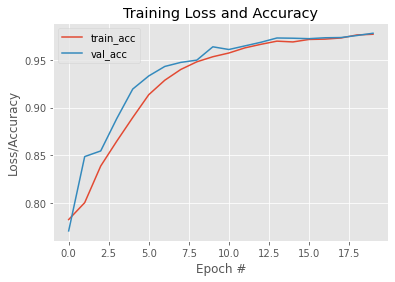

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)


print(Y.shape)



opt = "adam"

#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0

#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#print("L1 :", r,"L2:",g)
#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2, lambda1 = 0.0000000001, lambda2 = 0.0000001)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = opt , metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

#model_lenet.save("/content/drive/MyDrive/Deep_Fake/model/LeNet/Activity_Kernel/model_LeNetL1="+str(r)+"L2="+str(g), overwrite= True)

### Optimizers

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1
from tensorflow.keras.layers import Dropout
class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)


for opt in ["Adam","RMSProp", "Nadam","Adagrad","Adadelta", "Adamax"]:
    
    #Spliting the train ,test  and Validation data
        (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
        (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



        #((trainX, trainY), (testX, testY)) = cifar10.load_data()


        #Scaling the data
        trainX = trainX.astype('float32')/255.0
        testX = testX.astype('float32')/255.0
        
        #Conversion into categorical format
        trainY = to_categorical(trainY, 2)
        testY = to_categorical(testY, 2)

        #print("L1 :", r,"L2:",g)
        #Building the LeNet
        model_lenet = LeNet.build(50, 50, 3, 2, lambda1 = 0.0000000001, lambda2 = 0.0000001)
        #Compile the model
        model_lenet.compile(loss = 'categorical_crossentropy', optimizer = opt , metrics = ['accuracy'])

        print("[INFO] training network...")
        maxIt = 20
        H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
        print(model_lenet.summary())

        #Saving the model to be used further
        #joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
        #Performance Measurement.
        print('\n Test accuracy')
        predictedY = model_lenet.predict(testX)
        predictedY = predictedY.argmax(axis=1)
        testY = testY.argmax(axis=1)
        print(classification_report(testY, predictedY))

    

        

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 26ms/step - loss: 0.5042 - accuracy: 0.7820 - val_loss: 0.4286 - val_accuracy: 0.7991
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.3646 - accuracy: 0.8358 - val_loss: 0.3127 - val_accuracy: 0.8602
Epoch 3/20
133/133 [==============================] - 3s 24ms/step - loss: 0.2523 - accuracy: 0.8939 - val_loss: 0.2290 - val_accuracy: 0.9000
Epoch 4/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1694 - accuracy: 0.9290 - val_loss: 0.1532 - val_accuracy: 0.9455
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1189 - accuracy: 0.9517 - val_loss: 0.1267 - val_accuracy: 0.9469
Epoch 6/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0910 - accuracy: 0.9632 - val_loss: 0.1177 - val_accuracy: 0.9451
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0689 - a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.77      1.00      0.87      5462
           1       0.00      0.00      0.00      1607

    accuracy                           0.77      7069
   macro avg       0.39      0.50      0.44      7069
weighted avg       0.60      0.77      0.67      7069

[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 26ms/step - loss: 0.5162 - accuracy: 0.7734 - val_loss: 0.4462 - val_accuracy: 0.7864
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.4106 - accuracy: 0.8129 - val_loss: 0.3696 - val_accuracy: 0.8418
Epoch 3/20
133/133 [==============================] - 3s 24ms/step - loss: 0.3260 - accuracy: 0.8622 - val_loss: 0.2867 - val_accuracy: 0.8783
Epoch 4/20
133/133 [==============================] - 3s 25ms/step - loss: 0.2517 - accuracy: 0.8935 - val_loss: 0.2420 - val_accuracy: 0.9026
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss:

### Loss Functions

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)


print(Y.shape)
opt = "adam"

#lloss = "binary_crossentropy"
for lloss in ["binary_crossentropy","categorical_crossentropy"]:

    #Spliting the train ,test  and Validation data
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



    #((trainX, trainY), (testX, testY)) = cifar10.load_data()


    #Scaling the data
    trainX = trainX.astype('float32')/255.0
    testX = testX.astype('float32')/255.0

    #Conversion into categorical format
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)



    #Building the LeNet
    model_lenet = LeNet.build(50, 50, 3, 2, lambda1 =0, lambda2 = 0)
    #Compile the model
    model_lenet.compile(loss = lloss, optimizer = opt, metrics = ['accuracy'])

    print("[INFO] training network...")
    maxIt = 20
    H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
    print(model_lenet.summary())

    #Performance Measurement.
    print('\n Test accuracy')
    predictedY = model_lenet.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY))




(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 25ms/step - loss: 0.4980 - accuracy: 0.7835 - val_loss: 0.4047 - val_accuracy: 0.8092
Epoch 2/20
133/133 [==============================] - 3s 23ms/step - loss: 0.3138 - accuracy: 0.8599 - val_loss: 0.2352 - val_accuracy: 0.8965
Epoch 3/20
133/133 [==============================] - 3s 22ms/step - loss: 0.2022 - accuracy: 0.9148 - val_loss: 0.1694 - val_accuracy: 0.9293
Epoch 4/20
133/133 [==============================] - 3s 23ms/step - loss: 0.1385 - accuracy: 0.9445 - val_loss: 0.1400 - val_accuracy: 0.9429
Epoch 5/20
133/133 [==============================] - 3s 23ms/step - loss: 0.1058 - accuracy: 0.9561 - val_loss: 0.1158 - val_accuracy: 0.9500
Epoch 6/20
133/133 [==============================] - 3s 23ms/step - loss: 0.0909 - accuracy: 0.9643 - val_loss: 0.0969 - val_accuracy: 0.9604
Epoch 7/20
133/133 [==============================] - 3s 23ms/step - loss: 0.0823 - a

### Padding


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'valid', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'valid', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'valid', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 2s 18ms/step - loss: 0.4807 - accuracy: 0.7890 - val_loss: 0.4007 - val_accuracy: 0.8187
Epoch 2/20
133/133 [==============================] - 2s 16ms/step - loss: 0.3135 - accuracy: 0.8628 - val_loss: 0.2893 - val_accuracy: 0.8753
Epoch 3/20
133/133 [==============================] - 2s 16ms/step - loss: 0.2225 - accuracy: 0.9091 - val_loss: 0.2370 - val_accuracy: 0.8991
Epoch 4/20
133/133 [==============================] - 2s 16ms/step - loss: 0.1647 - accuracy: 0.9355 - val_loss: 0.1560 - val_accuracy: 0.9326
Epoch 5/20
133/133 [==============================] - 2s 16ms/step - loss: 0.1346 - accuracy: 0.9465 - val_loss: 0.1305 - val_accuracy: 0.9446
Epoch 6/20
133/133 [==============================] - 2s 16ms/step - loss: 0.1072 - accuracy: 0.9582 - val_loss: 0.1466 - val_accuracy: 0.9422
Epoch 7/20
133/133 [==============================] - 2s 16ms/step - loss: 0.0985 - a

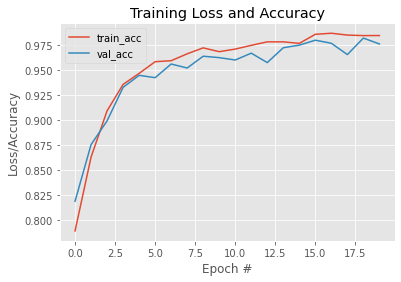

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)

print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)





#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### Strides

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'valid', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (1, 1)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'valid', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (1, 1)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'valid', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 12s 87ms/step - loss: 0.7047 - accuracy: 0.7802 - val_loss: 0.4968 - val_accuracy: 0.7715
Epoch 2/20
133/133 [==============================] - 11s 85ms/step - loss: 0.3902 - accuracy: 0.8288 - val_loss: 0.3054 - val_accuracy: 0.8656
Epoch 3/20
133/133 [==============================] - 11s 86ms/step - loss: 0.2812 - accuracy: 0.8815 - val_loss: 0.2529 - val_accuracy: 0.8878
Epoch 4/20
133/133 [==============================] - 11s 86ms/step - loss: 0.2129 - accuracy: 0.9113 - val_loss: 0.2133 - val_accuracy: 0.9142
Epoch 5/20
133/133 [==============================] - 11s 86ms/step - loss: 0.1683 - accuracy: 0.9309 - val_loss: 0.1673 - val_accuracy: 0.9368
Epoch 6/20
133/133 [==============================] - 11s 86ms/step - loss: 0.1255 - accuracy: 0.9505 - val_loss: 0.1407 - val_accuracy: 0.9444
Epoch 7/20
133/133 [==============================] - 11s 86ms/step - loss: 0.1

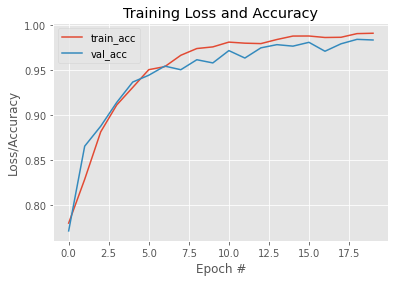

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)

print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)




#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 2s 17ms/step - loss: 0.5029 - accuracy: 0.7851 - val_loss: 0.4185 - val_accuracy: 0.8062
Epoch 2/20
133/133 [==============================] - 2s 14ms/step - loss: 0.3238 - accuracy: 0.8605 - val_loss: 0.2692 - val_accuracy: 0.8859
Epoch 3/20
133/133 [==============================] - 2s 15ms/step - loss: 0.2105 - accuracy: 0.9145 - val_loss: 0.1972 - val_accuracy: 0.9234
Epoch 4/20
133/133 [==============================] - 2s 15ms/step - loss: 0.1554 - accuracy: 0.9365 - val_loss: 0.1656 - val_accuracy: 0.9316
Epoch 5/20
133/133 [==============================] - 2s 15ms/step - loss: 0.1236 - accuracy: 0.9488 - val_loss: 0.1526 - val_accuracy: 0.9375
Epoch 6/20
133/133 [==============================] - 2s 15ms/step - loss: 0.1037 - accuracy: 0.9591 - val_loss: 0.2064 - val_accuracy: 0.9205
Epoch 7/20
133/133 [==============================] - 2s 15ms/step - loss: 0.0948 - a

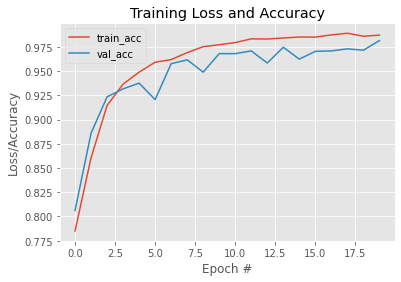

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)

print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)





#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### Number of Neurons, Filters and Fillter Size

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (7, 7), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (7, 7), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (7, 7), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 20ms/step - loss: 0.4908 - accuracy: 0.7840 - val_loss: 0.3962 - val_accuracy: 0.8135
Epoch 2/20
133/133 [==============================] - 2s 18ms/step - loss: 0.3122 - accuracy: 0.8655 - val_loss: 0.2563 - val_accuracy: 0.8918
Epoch 3/20
133/133 [==============================] - 2s 18ms/step - loss: 0.2045 - accuracy: 0.9164 - val_loss: 0.1960 - val_accuracy: 0.9184
Epoch 4/20
133/133 [==============================] - 2s 18ms/step - loss: 0.1586 - accuracy: 0.9349 - val_loss: 0.1660 - val_accuracy: 0.9373
Epoch 5/20
133/133 [==============================] - 2s 18ms/step - loss: 0.1227 - accuracy: 0.9517 - val_loss: 0.1510 - val_accuracy: 0.9392
Epoch 6/20
133/133 [==============================] - 2s 18ms/step - loss: 0.1021 - accuracy: 0.9588 - val_loss: 0.1212 - val_accuracy: 0.9507
Epoch 7/20
133/133 [==============================] - 2s 18ms/step - loss: 0.0858 - a

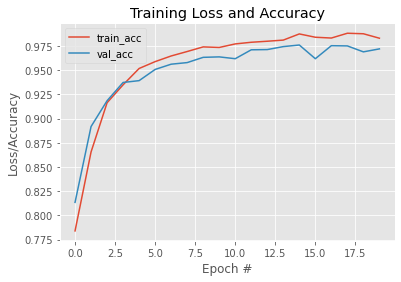

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)





#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(64, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(128, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional layer
        model.add(Conv2D(256, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 4s 27ms/step - loss: 0.5118 - accuracy: 0.7799 - val_loss: 0.4556 - val_accuracy: 0.7904
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.3403 - accuracy: 0.8509 - val_loss: 0.2819 - val_accuracy: 0.8826
Epoch 3/20
133/133 [==============================] - 3s 24ms/step - loss: 0.2355 - accuracy: 0.9037 - val_loss: 0.2318 - val_accuracy: 0.9071
Epoch 4/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1709 - accuracy: 0.9322 - val_loss: 0.1865 - val_accuracy: 0.9203
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1410 - accuracy: 0.9432 - val_loss: 0.1606 - val_accuracy: 0.9401
Epoch 6/20
133/133 [==============================] - 3s 25ms/step - loss: 0.1060 - accuracy: 0.9590 - val_loss: 0.1391 - val_accuracy: 0.9498
Epoch 7/20
133/133 [==============================] - 3s 25ms/step - loss: 0.0921 - a

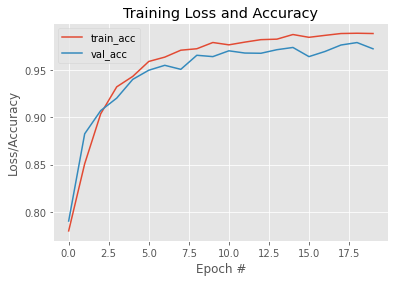

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()

print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



#((trainX, trainY), (testX, testY)) = cifar10.load_data()


#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(256, (7, 7), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(128, (7, 7), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (4, 4)))
        
        # add another convolutional layer
        model.add(Conv2D(64, (7, 7), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 12s 90ms/step - loss: 0.4978 - accuracy: 0.7902 - val_loss: 0.3947 - val_accuracy: 0.8222
Epoch 2/20
133/133 [==============================] - 12s 88ms/step - loss: 0.3335 - accuracy: 0.8586 - val_loss: 0.2875 - val_accuracy: 0.8797
Epoch 3/20
133/133 [==============================] - 12s 88ms/step - loss: 0.2401 - accuracy: 0.9002 - val_loss: 0.2325 - val_accuracy: 0.9092
Epoch 4/20
133/133 [==============================] - 12s 88ms/step - loss: 0.1841 - accuracy: 0.9259 - val_loss: 0.1862 - val_accuracy: 0.9255
Epoch 5/20
133/133 [==============================] - 12s 88ms/step - loss: 0.1327 - accuracy: 0.9478 - val_loss: 0.1635 - val_accuracy: 0.9363
Epoch 6/20
133/133 [==============================] - 12s 88ms/step - loss: 0.1124 - accuracy: 0.9563 - val_loss: 0.1283 - val_accuracy: 0.9491
Epoch 7/20
133/133 [==============================] - 12s 87ms/step - loss: 0.0

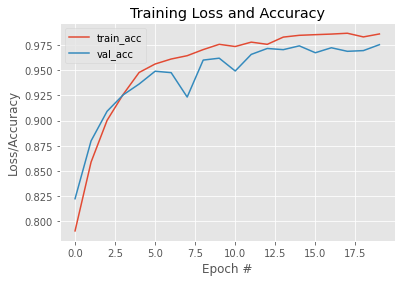

In [ ]:
from tensorflow.keras.datasets import cifar10 

from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)

print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)



#((trainX, trainY), (testX, testY)) = cifar10.load_data()


#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

##ResNet

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils


class ResNet:
    def residual_module(data, K, stride, channelsDim, reduce = False, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9):
        shortcut = data
        
        # 1x1 CONVs
        bn1 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(data)
        act1 = Activation('relu')(bn1)
        conv1 = Conv2D(int(K * 0.25), (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act1)
        
        # 3x3 CONVs
        bn2 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv1)
        act2 = Activation('relu')(bn2)
        conv2 = Conv2D(int(K * 0.25), (3, 3), strides = stride, padding = 'same', use_bias = False, kernel_regularizer = l2(reg))(act2)
        
        # 1x1 CONVs
        bn3 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv2)
        act3 = Activation('relu')(bn3)
        conv3 = Conv2D(K, (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act3)
        
        # if we reduce the spatial size, apply a CONV layer to the shortcut
        if reduce:
            shortcut = Conv2D(K, (1, 1), strides = stride, use_bias = False, kernel_regularizer = l2(reg))(act1)
            
        # add the shortcut and the final CONV
        x = add([conv3, shortcut])
        
        return x
    
    def build(width, height, depth, classes, stages, filters, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9, dataset='cifar'):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == 'channels_first':
            inputShape = (depth, height, width)
            channelsDim = 1
            
        # set the input and apply BN
        inputs = Input(shape = inputShape)
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(inputs)
        
        if dataset == 'cifar':
            # apply a single CONV layer
            x = Conv2D(filters[0], (3, 3), use_bias = False, padding = 'same',
                       kernel_regularizer = l2(reg))(x)
        
        # loop over the number of stages
        for counter in range(0, len(stages)):
            # initialize the stride
            if counter == 0:
                stride = (1, 1)
            else:
                stride = (2, 2)
                    
            # apply a residual module to reduce the spatial dimension of the image volume
            x = ResNet.residual_module(x, filters[counter + 1], stride, channelsDim, reduce = True, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
            
            # loop over the number of layers in the current stage
            for j in range(0, stages[counter] - 1):
                # apply a residual module
                x = ResNet.residual_module(x, filters[counter + 1], (1, 1), channelsDim, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
                    
        # apply BN -> ACT -> POOL
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(x)
        x = Activation('relu')(x)
        x = AveragePooling2D((8, 8))(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes, kernel_regularizer = l2(reg))(x)
        x = Activation('softmax')(x)
        
        # create the model
        model = Model(inputs, x, name = 'ResNet')
        
        # return the model
        return model



        



In [ ]:
#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


###Loss

[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_83 (BatchNo (None, 50, 50, 3)    12          input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_85 (Conv2D)              (None, 50, 50, 64)   1728        batch_normalization_83[0][0]     
__________________________________________________________________________________________________
batch_normalization_84 (BatchNo (None, 50, 50, 64)   256         conv2d_85[0][0]                  
___________________________________________________________________

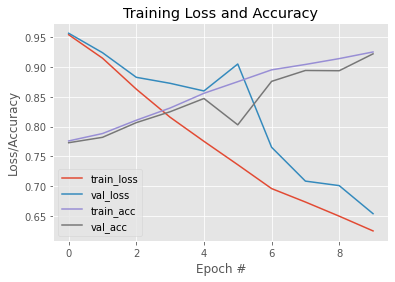

In [ ]:


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 10
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
              steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_166 (BatchN (None, 50, 50, 3)    12          input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_170 (Conv2D)             (None, 50, 50, 64)   1728        batch_normalization_166[0][0]    
__________________________________________________________________________________________________
batch_normalization_167 (BatchN (None, 50, 50, 64)   256         conv2d_170[0][0]                 
___________________________________________________________________

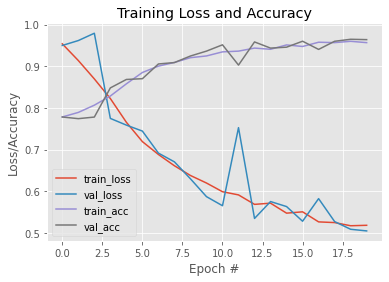

In [ ]:


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 20
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
              steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### Optimizer

In [ ]:

for opt in ["Adam","RMSProp", "Nadam","Adagrad"]:
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
    print("Optimizer : ", opt)
    trainX = trainX.astype("float")
    testX = testX.astype("float")

    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 30
    print("[INFO] compiling model...")
    opt = SGD(lr = 0.1)
    model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])

    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
                steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

Optimizer :  Adam
[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 50, 50, 3)    12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 50, 50, 64)   1728        batch_normalization[0][0]        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 50, 50, 64)   256         conv2d[0][0]                     
_________________________________________________

Optimizer :  Adadelta
[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 50, 50, 3)    12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 50, 50, 64)   1728        batch_normalization[0][0]        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 50, 50, 64)   256         conv2d[0][0]                     
_____________________________________________

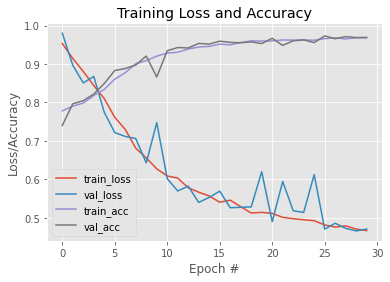

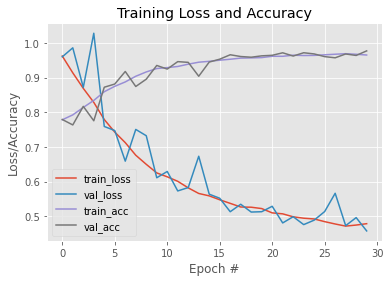

In [ ]:
for opt in ["Adadelta", "Adamax"]:
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
    print("Optimizer : ", opt)
    trainX = trainX.astype("float")
    testX = testX.astype("float")

    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 30
    print("[INFO] compiling model...")
    opt = SGD(lr = 0.1)
    model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])

    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
                steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

###Activation


In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils


class ResNet:
    def residual_module(data, K, stride, channelsDim, reduce = False, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9):
        shortcut = data
        
        # 1x1 CONVs
        bn1 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(data)
        act1 = Activation('tanh')(bn1)
        conv1 = Conv2D(int(K * 0.25), (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act1)
        
        # 3x3 CONVs
        bn2 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv1)
        act2 = Activation('tanh')(bn2)
        conv2 = Conv2D(int(K * 0.25), (3, 3), strides = stride, padding = 'same', use_bias = False, kernel_regularizer = l2(reg))(act2)
        
        # 1x1 CONVs
        bn3 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv2)
        act3 = Activation('tanh')(bn3)
        conv3 = Conv2D(K, (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act3)
        
        # if we reduce the spatial size, apply a CONV layer to the shortcut
        if reduce:
            shortcut = Conv2D(K, (1, 1), strides = stride, use_bias = False, kernel_regularizer = l2(reg))(act1)
            
        # add the shortcut and the final CONV
        x = add([conv3, shortcut])
        
        return x
    
    def build(width, height, depth, classes, stages, filters, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9, dataset='cifar'):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == 'channels_first':
            inputShape = (depth, height, width)
            channelsDim = 1
            
        # set the input and apply BN
        inputs = Input(shape = inputShape)
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(inputs)
        
        if dataset == 'cifar':
            # apply a single CONV layer
            x = Conv2D(filters[0], (3, 3), use_bias = False, padding = 'same',
                       kernel_regularizer = l2(reg))(x)
        
        # loop over the number of stages
        for counter in range(0, len(stages)):
            # initialize the stride
            if counter == 0:
                stride = (1, 1)
            else:
                stride = (2, 2)
                    
            # apply a residual module to reduce the spatial dimension of the image volume
            x = ResNet.residual_module(x, filters[counter + 1], stride, channelsDim, reduce = True, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
            
            # loop over the number of layers in the current stage
            for j in range(0, stages[counter] - 1):
                # apply a residual module
                x = ResNet.residual_module(x, filters[counter + 1], (1, 1), channelsDim, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
                    
        # apply BN -> ACT -> POOL
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(x)
        x = Activation('tanh')(x)
        x = AveragePooling2D((8, 8))(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes, kernel_regularizer = l2(reg))(x)
        x = Activation('softmax')(x)
        
        # create the model
        model = Model(inputs, x, name = 'ResNet')
        
        # return the model
        return model


Optimizer :  <tensorflow.python.keras.optimizer_v2.gradient_descent.SGD object at 0x7f11d44a29e8>
[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_166 (BatchN (None, 50, 50, 3)    12          input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_170 (Conv2D)             (None, 50, 50, 64)   1728        batch_normalization_166[0][0]    
__________________________________________________________________________________________________
batch_normalization_167 (BatchN (None, 50, 50, 64)   256         con

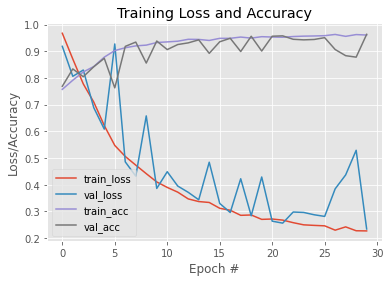

In [ ]:

(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
print("Optimizer : ", opt)
trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 30
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'binary_crossentropy', optimizer = "adam", metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
            steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils


class ResNet:
    def residual_module(data, K, stride, channelsDim, reduce = False, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9):
        shortcut = data
        
        # 1x1 CONVs
        bn1 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(data)
        act1 = Activation('sigmoid')(bn1)
        conv1 = Conv2D(int(K * 0.25), (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act1)
        
        # 3x3 CONVs
        bn2 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv1)
        act2 = Activation('sigmoid')(bn2)
        conv2 = Conv2D(int(K * 0.25), (3, 3), strides = stride, padding = 'same', use_bias = False, kernel_regularizer = l2(reg))(act2)
        
        # 1x1 CONVs
        bn3 = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(conv2)
        act3 = Activation('sigmoid')(bn3)
        conv3 = Conv2D(K, (1, 1), use_bias = False, kernel_regularizer = l2(reg))(act3)
        
        # if we reduce the spatial size, apply a CONV layer to the shortcut
        if reduce:
            shortcut = Conv2D(K, (1, 1), strides = stride, use_bias = False, kernel_regularizer = l2(reg))(act1)
            
        # add the shortcut and the final CONV
        x = add([conv3, shortcut])
        
        return x
    
    def build(width, height, depth, classes, stages, filters, reg = 0.0001, bnEpsilon = 0.00002, bnMomentum = 0.9, dataset='cifar'):
        inputShape = (height, width, depth)
        channelsDim = -1
        
        if backend.image_data_format() == 'channels_first':
            inputShape = (depth, height, width)
            channelsDim = 1
            
        # set the input and apply BN
        inputs = Input(shape = inputShape)
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(inputs)
        
        if dataset == 'cifar':
            # apply a single CONV layer
            x = Conv2D(filters[0], (3, 3), use_bias = False, padding = 'same',
                       kernel_regularizer = l2(reg))(x)
        
        # loop over the number of stages
        for counter in range(0, len(stages)):
            # initialize the stride
            if counter == 0:
                stride = (1, 1)
            else:
                stride = (2, 2)
                    
            # apply a residual module to reduce the spatial dimension of the image volume
            x = ResNet.residual_module(x, filters[counter + 1], stride, channelsDim, reduce = True, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
            
            # loop over the number of layers in the current stage
            for j in range(0, stages[counter] - 1):
                # apply a residual module
                x = ResNet.residual_module(x, filters[counter + 1], (1, 1), channelsDim, bnEpsilon = bnEpsilon, bnMomentum = bnMomentum)
                    
        # apply BN -> ACT -> POOL
        x = BatchNormalization(axis = channelsDim, epsilon = bnEpsilon, momentum = bnMomentum)(x)
        x = Activation('sigmoid')(x)
        x = AveragePooling2D((8, 8))(x)
        
        # softmax classifier
        x = Flatten()(x)
        x = Dense(classes, kernel_regularizer = l2(reg))(x)
        x = Activation('softmax')(x)
        
        # create the model
        model = Model(inputs, x, name = 'ResNet')
        
        # return the model
        return model

Optimizer :  <tensorflow.python.keras.optimizer_v2.gradient_descent.SGD object at 0x7f11d44b3fd0>
[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_249 (BatchN (None, 50, 50, 3)    12          input_4[0][0]                    
__________________________________________________________________________________________________
conv2d_255 (Conv2D)             (None, 50, 50, 64)   1728        batch_normalization_249[0][0]    
__________________________________________________________________________________________________
batch_normalization_250 (BatchN (None, 50, 50, 64)   256         con

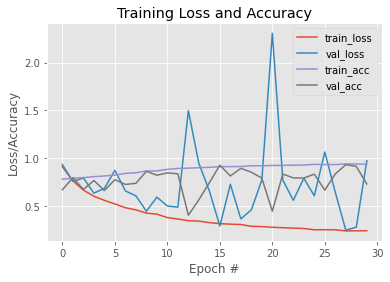

In [ ]:
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
print("Optimizer : ", opt)
trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 30
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
model.compile(loss = 'binary_crossentropy', optimizer = "adam", metrics=['accuracy'])

# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
            steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### Learning Rate

[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 50, 50, 3)    12          input_1[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 50, 50, 64)   1728        batch_normalization[0][0]        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 50, 50, 64)   256         conv2d[0][0]                     
___________________________________________________________________

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0     0.7727    1.0000    0.8718      5462
           1     0.0000    0.0000    0.0000      1607

    accuracy                         0.7727      7069
   macro avg     0.3863    0.5000    0.4359      7069
weighted avg     0.5970    0.7727    0.6736      7069

[INFO] compiling model...
Model: "ResNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 50, 50, 3)]  0                                            
__________________________________________________________________________________________________
batch_normalization_83 (BatchNo (None, 50, 50, 3)    12          input_2[0][0]                    
__________________________________________________________________________________________________
conv2d_85 (Conv2D)              (None

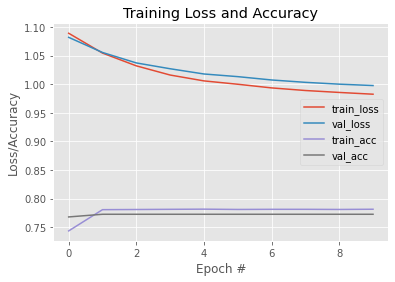

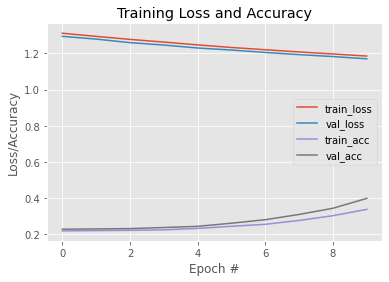

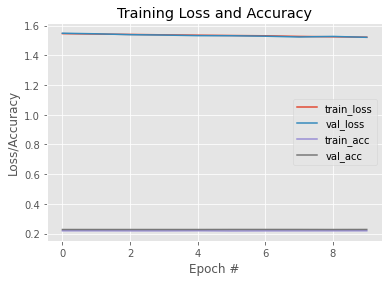

In [ ]:


for l in [0.0001,0.00001,0.000001]:
    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


    trainX = trainX.astype("float")
    testX = testX.astype("float")

    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 10
    print("[INFO] compiling model...")
    opt = SGD(lr = l)
    model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])

    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size= 128), validation_data=(testX, testY),
                steps_per_epoch= len(trainX) // 128, epochs= epochs_value, verbose=1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))

    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

##MiniVGGNet

In [ ]:
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import add
from tensorflow.keras import backend
from sklearn.model_selection import train_test_split
import numpy as np
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.preprocessing import image
from keras.utils import np_utils

In [ ]:
class MiniVGGNet:
    def build(height, width, depth, classes):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'MiniVGGNet')
                
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # flatten the activations from a square to a vector
        model.add(Flatten())
        
        # fully-connected layer
        model.add(Dense(512))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fully-connected layer with softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

In [ ]:

(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


###Loss


[INFO] compiling model...
Model: "MiniVGGNet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 50, 50, 32)        896       
_________________________________________________________________
activation (Activation)      (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 50, 50, 32)        128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 50, 50, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (

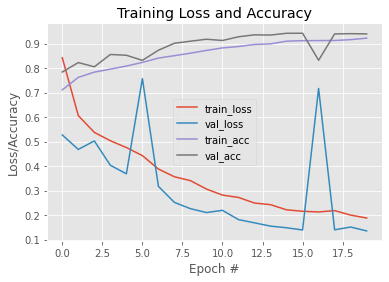

In [ ]:


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 20
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = MiniVGGNet.build(50, 50, 3, 2)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])


# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

[INFO] compiling model...
Model: "MiniVGGNet"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 50, 50, 32)        896       
_________________________________________________________________
activation_6 (Activation)    (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 50, 50, 32)        9248      
_________________________________________________________________
activation_7 (Activation)    (None, 50, 50, 32)        0         
_________________________________________________________________
batch_normalization_6 (Batch (None, 50, 50, 32)        128       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (

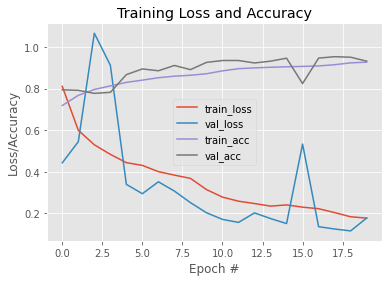

In [ ]:


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 20
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = MiniVGGNet.build(50, 50, 3, 2)
model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])


# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

### Optimizer

In [ ]:

for opt in ["Adam","RMSProp", "Nadam","Adagrad","Adadelta", "Adamax"]:

    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


    trainX = trainX.astype("float")
    testX = testX.astype("float")

    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 20
    print("[INFO] compiling model...")
    opt = SGD(lr = 0.1)
    model = MiniVGGNet.build(50, 50, 3, 2)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics = ['accuracy'])


    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))

    '''
    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()'''

## MesoNet

###Loss

In [ ]:
class Meso4:
    def build(height, width, depth, classes):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'Meso4') 
        
        #x = (height, width, depth)
        '''x = Input(shape = (height,
                           width,
                           depth))'''
        
        model.add(Conv2D(8, (3, 3), padding='valid', activation = 'relu',input_shape = (height, width, depth)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(8, (5, 5), padding='same', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = 'relu'))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(4, 4), padding='same'))
        
        model.add(Flatten())
        model.add(Dropout(0.5))
        model.add(Dense(16))
        model.add(LeakyReLU(alpha=0.1))
        model.add(Dropout(0.5))
        model.add(Dense(classes, activation = 'sigmoid'))

        return model

[INFO] compiling model...
Model: "Meso4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 48, 48, 8)         224       
_________________________________________________________________
batch_normalization_3 (Batch (None, 48, 48, 8)         32        
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 24, 24, 8)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 24, 8)         1608      
_________________________________________________________________
batch_normalization_4 (Batch (None, 24, 24, 8)         32        
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 12, 12, 8)         0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None,

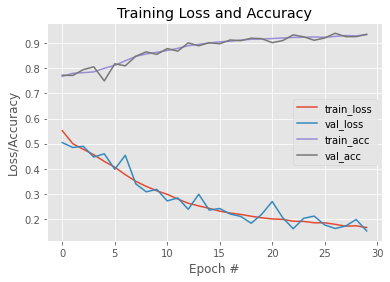

In [ ]:
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


trainX = trainX.astype("float")
testX = testX.astype("float")

# apply mean subtraction to the data
mean = np.mean(trainX, axis=0)
trainX -= mean
testX -= mean

# convert the labels from integers to vectors
lb = LabelBinarizer()
trainY = lb.fit_transform(trainY)
testY = lb.transform(testY)
valY = lb.transform(valY)
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)
valY = to_categorical(valY, 2)



aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
epochs_value = 30
#print("Optimizer : ", opt)
print("[INFO] compiling model...")
opt = SGD(lr = 0.1)
model = Meso4.build(50, 50, 3, 2)
model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])


# print a model summary
print(model.summary())

print("[INFO] training network...")
H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

# print a classification report
print('\n Test accuracy')
predictedY = model.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY, digits=4))


# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
class Meso4:
    def build(height, width, depth, classes,act='relu'):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'Meso4') 
        
        #x = (height, width, depth)
        '''x = Input(shape = (height,
                           width,
                           depth))'''
        
        model.add(Conv2D(8, (3, 3), padding='valid', activation = act,input_shape = (height, width, depth)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(8, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(4, 4), padding='same'))
        
        model.add(Flatten())
        model.add(Dropout(0.5))
        model.add(Dense(16))
        model.add(LeakyReLU(alpha=0.1))
        model.add(Dropout(0.5))
        model.add(Dense(classes, activation = 'sigmoid'))

        return model

### Activation

Activation: tanh
[INFO] compiling model...
Model: "Meso4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 48, 48, 8)         224       
_________________________________________________________________
batch_normalization_18 (Batc (None, 48, 48, 8)         32        
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 24, 24, 8)         0         
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 24, 24, 8)         1608      
_________________________________________________________________
batch_normalization_19 (Batc (None, 24, 24, 8)         32        
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 12, 12, 8)         0         
_________________________________________________________________
conv2d_22 (Conv2D)

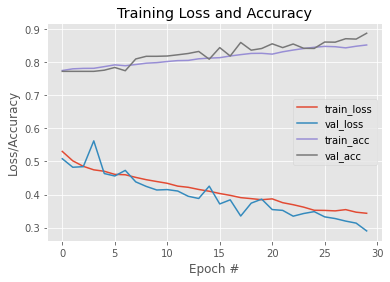

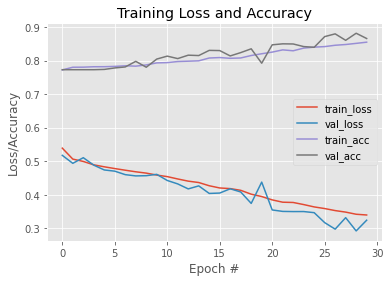

In [ ]:

for a in ["tanh","sigmoid"]:

    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


    trainX = trainX.astype("float")
    testX = testX.astype("float")
    print("Activation:",a)
    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 30
    #print("Optimizer : ", opt)
    print("[INFO] compiling model...")
    opt = SGD(lr = 0.1)
    model = Meso4.build(50, 50, 3, 2,act=a)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])


    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))


    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

In [ ]:
class Meso4:
    def build(height, width, depth, classes,act='relu'):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'Meso4') 
        
        #x = (height, width, depth)
        '''x = Input(shape = (height,
                           width,
                           depth))'''
        
        model.add(Conv2D(8, (3, 3), padding='valid', activation = act,input_shape = (height, width, depth)))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(8, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(2, 2), padding='same'))
        
        model.add(Conv2D(16, (5, 5), padding='same', activation = act))
        model.add(BatchNormalization())
        model.add(MaxPooling2D(pool_size=(4, 4), padding='same'))
        
        model.add(Flatten())
        model.add(Dropout(0.5))
        model.add(Dense(16))
        model.add(LeakyReLU(alpha=0.1))
        model.add(Dropout(0.5))
        model.add(Dense(classes, activation = 'sigmoid'))

        return model

###Optimizer

Optimizer: Adam
[INFO] compiling model...
Model: "Meso4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 48, 48, 8)         224       
_________________________________________________________________
batch_normalization_4 (Batch (None, 48, 48, 8)         32        
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 24, 24, 8)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 24, 24, 8)         1608      
_________________________________________________________________
batch_normalization_5 (Batch (None, 24, 24, 8)         32        
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 12, 12, 8)         0         
_________________________________________________________________
conv2d_6 (Conv2D)  

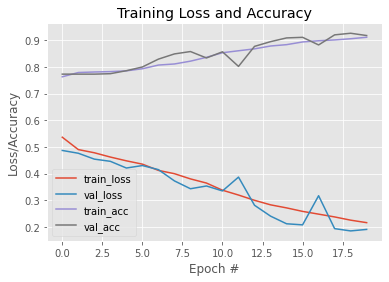

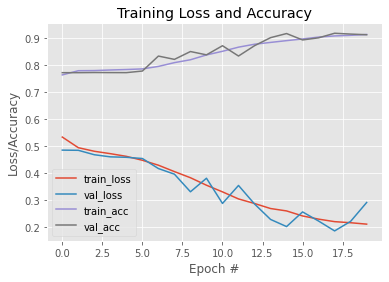

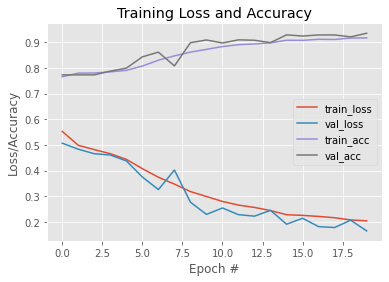

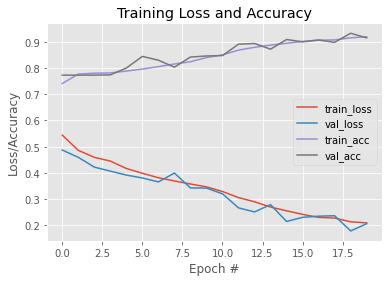

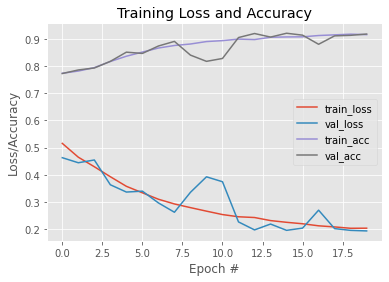

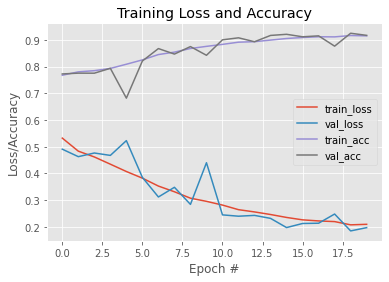

In [ ]:
for opt in ['Adam','Nadam','adagrad','RMSprop','Adadelta',"Adagrad"]:

    a ="relu"

    (trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
    (testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)


    trainX = trainX.astype("float")
    testX = testX.astype("float")
    print("Optimizer:",opt)
    # apply mean subtraction to the data
    mean = np.mean(trainX, axis=0)
    trainX -= mean
    testX -= mean

    # convert the labels from integers to vectors
    lb = LabelBinarizer()
    trainY = lb.fit_transform(trainY)
    testY = lb.transform(testY)
    valY = lb.transform(valY)
    trainY = to_categorical(trainY, 2)
    testY = to_categorical(testY, 2)
    valY = to_categorical(valY, 2)



    aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
    epochs_value = 20
    #print("Optimizer : ", opt)
    print("[INFO] compiling model...")
    opt = SGD(lr = 0.1)
    model = Meso4.build(50, 50, 3, 2,act=a)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])


    # print a model summary
    print(model.summary())

    print("[INFO] training network...")
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)

    # print a classification report
    print('\n Test accuracy')
    predictedY = model.predict(testX)
    predictedY = predictedY.argmax(axis=1)
    testY = testY.argmax(axis=1)
    print(classification_report(testY, predictedY, digits=4))


    # plot the training loss and accuracy
    plt.style.use("ggplot")
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history["loss"], label="train_loss")
    plt.plot(np.arange(0, epochs_value), H.history["val_loss"], label="val_loss")
    plt.plot(np.arange(0, epochs_value), H.history["accuracy"], label="train_acc")
    plt.plot(np.arange(0, epochs_value), H.history["val_accuracy"], label="val_acc")
    plt.title("Training Loss and Accuracy")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend()

#Ensemble

##Import

In [ ]:
# basic packages
from imutils import paths
import cv2
import glob
import h5py
import imutils
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import progressbar
import random

# sklearn functions
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder

# keras functions
from tensorflow.keras import backend
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical

##Ensemble with same parameters

In [ ]:
##Ensemble on Same Net

In [ ]:
!rm -rf /content/drive/MyDrive/Deep_Fake/models1

In [ ]:
# basic packages
from imutils import paths
import cv2
import glob
import h5py
import imutils
import matplotlib.pyplot as plt
import numpy as np
import os
import pickle
import progressbar
import random

# sklearn functions
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder

# keras functions
from tensorflow.keras import backend
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import add
from tensorflow.keras.models import load_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical

In [ ]:
%cd /content/drive/MyDrive/Deep_Fake

/content/drive/MyDrive/Deep_Fake


In [ ]:

import tensorflow as tf
from tensorflow.python.client import device_lib

numGPUs = len(tf.config.experimental.list_physical_devices('GPU'))

print("Num GPUs Available: ", numGPUs)

if numGPUs > 0:
    print(tf.test.gpu_device_name())
    print(device_lib.list_local_devices()[1].physical_device_desc)

Num GPUs Available:  1
/device:GPU:0
device: XLA_CPU device


In [ ]:
class MiniVGGNet:
    def build(height, width, depth, classes):
        # create the model and name it MiniVGGNet
        model = Sequential(name = 'MiniVGGNet')
                
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same', input_shape = (height, width, depth)))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 32 3x3 feature maps
        model.add(Conv2D(32, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # convolutional layer with 64 3x3 feature maps
        model.add(Conv2D(64, (3, 3), padding = 'same'))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        
        # 2x2 max pooling layer with stride 2x2
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        model.add(Dropout(0.25))
        
        # flatten the activations from a square to a vector
        model.add(Flatten())
        
        # fully-connected layer
        model.add(Dense(512))
        model.add(Activation('relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.5))
        
        # fully-connected layer with softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the model
        return model

In [ ]:
tf.keras.backend.clear_session()

# load cifar10 data
#((trainX, trainY), (testX, testY)) = cifar10.load_data()
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
labelNames = ["Fake","Real"]

# preprocess data
trainX = trainX.astype('float')/255.0
testX = testX.astype('float')/255.0
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode = 'nearest')

In [ ]:
!rm - rf /content/drive/MyDrive/Deep_Fake/models1

rm: cannot remove '-': No such file or directory
rm: cannot remove 'rf': No such file or directory
rm: cannot remove '/content/drive/MyDrive/Deep_Fake/models1': Is a directory


In [ ]:

numberOfModels = 5
epochs_value = 10

for i in range(numberOfModels):
    print('Net', i, 'is being trained...')
    
    # choose the optimizer
    #opt = SGD(lr = 0.01, decay = 0.1 / epochs, momentum = 0.9, nesterov = True)
    opt = Adam()
    
    # compile the model
    model = MiniVGGNet.build(50, 50, 3, 2)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs_value, steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models1', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output1', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), "w")
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output1', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs_value), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs_value), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs_value), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs_value), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

Net 0 is being trained...
Epoch 1/10
331/331 [==============================] - 21s 63ms/step - loss: 0.6238 - accuracy: 0.7405 - val_loss: 2.2390 - val_accuracy: 0.7727
Epoch 2/10
331/331 [==============================] - 20s 61ms/step - loss: 0.4215 - accuracy: 0.8146 - val_loss: 0.4875 - val_accuracy: 0.8390
Epoch 3/10
331/331 [==============================] - 20s 60ms/step - loss: 0.3514 - accuracy: 0.8510 - val_loss: 0.6262 - val_accuracy: 0.7786
Epoch 4/10
331/331 [==============================] - 20s 60ms/step - loss: 0.2953 - accuracy: 0.8734 - val_loss: 0.2781 - val_accuracy: 0.8789
Epoch 5/10
331/331 [==============================] - 20s 60ms/step - loss: 0.2649 - accuracy: 0.8879 - val_loss: 0.1934 - val_accuracy: 0.9315
Epoch 6/10
331/331 [==============================] - 20s 61ms/step - loss: 0.2324 - accuracy: 0.9022 - val_loss: 0.2336 - val_accuracy: 0.9039
Epoch 7/10
331/331 [==============================] - 20s 61ms/step - loss: 0.2190 - accuracy: 0.9080 - val_lo

In [ ]:
# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['models1', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(testX, batch_size=64))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis=0)
print(classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
              precision    recall  f1-score   support

        Fake       0.95      0.98      0.97      5462
        Real       0.93      0.83      0.88      1607

    accuracy                           0.95      7069
   macro avg       0.94      0.91      0.92      7069
weighted avg       0.95      0.95      0.95      7069



## Ensemble of Differenet Net (MiniVGGNet & ResNet)

In [ ]:
%cd /content/drive/MyDrive/Deep_Fake

/content/drive/MyDrive/Deep_Fake


In [ ]:
tf.keras.backend.clear_session()

# load cifar10 data
#((trainX, trainY), (testX, testY)) = cifar10.load_data()
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
labelNames = ["Fake","Real"]

# preprocess data
trainX = trainX.astype('float')/255.0
testX = testX.astype('float')/255.0
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode = 'nearest')

In [ ]:
tf.keras.backend.clear_session()

numberOfModels = 2
epochs = 10
#aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
opt = Adam()

for i in range(numberOfModels):
    print('MiniVGGNet', i, 'is being trained...')
    
    # compile the model
    model = MiniVGGNet.build(width = 50, height = 50, depth = 3, classes = 2)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models2', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output2', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output2', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()
    

for i in range(numberOfModels, 2*numberOfModels+1):
    print('ResNet', i, 'is being trained...')
    
    # compile the model
    model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models2', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output2', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output2', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/10
331/331 [==============================] - 19s 56ms/step - loss: 0.6202 - accuracy: 0.7354 - val_loss: 3.0239 - val_accuracy: 0.7727
Epoch 2/10
331/331 [==============================] - 18s 55ms/step - loss: 0.4107 - accuracy: 0.8180 - val_loss: 0.4441 - val_accuracy: 0.8359
Epoch 3/10
331/331 [==============================] - 18s 55ms/step - loss: 0.3407 - accuracy: 0.8530 - val_loss: 0.2858 - val_accuracy: 0.8745
Epoch 4/10
331/331 [==============================] - 18s 55ms/step - loss: 0.2920 - accuracy: 0.8774 - val_loss: 0.4477 - val_accuracy: 0.8229
Epoch 5/10
331/331 [==============================] - 18s 55ms/step - loss: 0.2484 - accuracy: 0.8945 - val_loss: 0.1746 - val_accuracy: 0.9260
Epoch 6/10
331/331 [==============================] - 19s 56ms/step - loss: 0.2248 - accuracy: 0.9056 - val_loss: 0.7557 - val_accuracy: 0.8010
Epoch 7/10
331/331 [==============================] - 18s 55ms/step - loss: 0.1935 - accuracy: 0.9198 -

In [ ]:
# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['models2', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(testX, batch_size = 64))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis = 0)
print(classification_report(testY.argmax(axis = 1), predictions.argmax(axis = 1), target_names = labelNames))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
              precision    recall  f1-score   support

        Fake       0.98      0.98      0.98      5462
        Real       0.93      0.93      0.93      1607

    accuracy                           0.97      7069
   macro avg       0.95      0.96      0.96      7069
weighted avg       0.97      0.97      0.97      7069



## Ensemble MiniVGGNet & LeNet

In [ ]:
%cd /content/drive/MyDrive/Deep_Fake

/content/drive/MyDrive/Deep_Fake


In [ ]:
tf.keras.backend.clear_session()

# load cifar10 data
#((trainX, trainY), (testX, testY)) = cifar10.load_data()
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
labelNames = ["Fake","Real"]

# preprocess data
trainX = trainX.astype('float')/255.0
testX = testX.astype('float')/255.0
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode = 'nearest')

In [ ]:
tf.keras.backend.clear_session()

numberOfModels = 2
epochs = 10
#aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
opt = Adam()

for i in range(numberOfModels):
    print('MiniVGGNet', i, 'is being trained...')
    
    # compile the model
    model = MiniVGGNet.build(width = 50, height = 50, depth = 3, classes = 2)
    model.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics=['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models3', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output3', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output3', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()
    

for i in range(numberOfModels, 2*numberOfModels+1):
    print('LeNet', i, 'is being trained...')
    
    # compile the model
    model_lenet = LeNet.build(50, 50, 3, 2)
    #Compile the model
    model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models3', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output3', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output3', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/10
331/331 [==============================] - 19s 57ms/step - loss: 0.6021 - accuracy: 0.7397 - val_loss: 1.0080 - val_accuracy: 0.7727
Epoch 2/10
331/331 [==============================] - 18s 55ms/step - loss: 0.4131 - accuracy: 0.8154 - val_loss: 0.4045 - val_accuracy: 0.8259
Epoch 3/10
331/331 [==============================] - 18s 55ms/step - loss: 0.3406 - accuracy: 0.8475 - val_loss: 0.3152 - val_accuracy: 0.8648
Epoch 4/10
331/331 [==============================] - 18s 56ms/step - loss: 0.3051 - accuracy: 0.8678 - val_loss: 0.2571 - val_accuracy: 0.8979
Epoch 5/10
331/331 [==============================] - 18s 54ms/step - loss: 0.2439 - accuracy: 0.8968 - val_loss: 0.7301 - val_accuracy: 0.7000
Epoch 6/10
331/331 [==============================] - 18s 54ms/step - loss: 0.2228 - accuracy: 0.9042 - val_loss: 0.2565 - val_accuracy: 0.8904
Epoch 7/10
331/331 [==============================] - 18s 55ms/step - loss: 0.1815 - accuracy: 0.9226 -

In [ ]:
# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['models3', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(testX, batch_size = 64))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis = 0)
print(classification_report(testY.argmax(axis = 1), predictions.argmax(axis = 1), target_names = labelNames))

Loading model 1/5
Loading model 2/5
Loading model 3/5
Loading model 4/5
Loading model 5/5
Evaluating ensemble...
              precision    recall  f1-score   support

        Fake       0.99      0.96      0.97      5462
        Real       0.88      0.95      0.92      1607

    accuracy                           0.96      7069
   macro avg       0.94      0.96      0.95      7069
weighted avg       0.96      0.96      0.96      7069



## Ensemble MiniVGGNet, LeNet & ResNet

In [ ]:
%cd /content/drive/MyDrive/Deep_Fake

/content/drive/MyDrive/Deep_Fake


In [ ]:
!pwd

/content/drive/MyDrive/Deep_Fake


In [ ]:
tf.keras.backend.clear_session()

# load cifar10 data
#((trainX, trainY), (testX, testY)) = cifar10.load_data()
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)
labelNames = ["Fake","Real"]

# preprocess data
trainX = trainX.astype('float')/255.0
testX = testX.astype('float')/255.0
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

# create an image generator for data augmentation with random shifting, rotation, and horizontal flips
aug = ImageDataGenerator(rotation_range = 10, width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode = 'nearest')

In [ ]:
tf.keras.backend.clear_session()

numberOfModels = 3
epochs = 10
#aug = ImageDataGenerator(width_shift_range = 0.1, height_shift_range = 0.1, horizontal_flip = True, fill_mode="nearest")
opt = Adam()

for i in range(2):
    print('MiniVGGNet', i, 'is being trained...')
    
    # compile the model
    model = MiniVGGNet.build(width = 50, height = 50, depth = 3, classes = 2)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models4', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output4', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output4', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()
    

for i in range(2):
    print('LeNet', i, 'is being trained...')
    
    # compile the model
    model_lenet = LeNet.build(50, 50, 3, 2)
    #Compile the model
    model_lenet.compile(loss = 'binary_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models4', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output4', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output4', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()




for i in range(2):
    print('ResNet', i, 'is being trained...')
    
    # compile the model
    model = ResNet.build(50, 50, 3, 2, (9, 9, 9), (64, 64, 128, 256), reg=0.0005)
    model.compile(loss = 'binary_crossentropy', optimizer = opt, metrics=['accuracy'])
    
    # train the model
    H = model.fit(aug.flow(trainX, trainY, batch_size = 64), validation_data = (testX, testY), epochs = epochs,
                  steps_per_epoch = len(trainX) // 64, verbose = 1)
    
    # save the model
    p = ['models4', 'model_{}.model'.format(i)]
    model.save(os.path.sep.join(p))
    
    # evaluate the network
    predictions = model.predict(testX, batch_size=64)
    report = classification_report(testY.argmax(axis=1), predictions.argmax(axis=1), target_names=labelNames)
    
    # save the classification report to file
    p = ['output4', 'model_{}.txt'.format(i)]
    f = open(os.path.sep.join(p), 'w')
    f.write(report)
    f.close()
    
    # plot the training loss and accuracy
    p = ['output4', 'model_{}.png'.format(i)]
    plt.style.use('ggplot')
    plt.figure()
    plt.plot(np.arange(0, epochs), H.history['loss'], label = 'train_loss')
    plt.plot(np.arange(0, epochs), H.history['val_loss'], label = 'val_loss')
    plt.plot(np.arange(0, epochs), H.history['accuracy'], label = 'train_acc')
    plt.plot(np.arange(0, epochs), H.history['val_accuracy'], label = 'val_acc')
    
    # add labels and legend
    plt.title('Training Loss and Accuracy for model {}'.format(i))
    plt.xlabel('Epoch #')
    plt.ylabel('Loss/Accuracy')
    plt.legend()
    
    # save graphs
    plt.savefig(os.path.sep.join(p))
    plt.close()

MiniVGGNet 0 is being trained...
Epoch 1/10
331/331 [==============================] - 18s 56ms/step - loss: 0.6088 - accuracy: 0.7426 - val_loss: 1.3244 - val_accuracy: 0.7727
Epoch 2/10
331/331 [==============================] - 18s 54ms/step - loss: 0.4244 - accuracy: 0.8120 - val_loss: 0.5094 - val_accuracy: 0.8003
Epoch 3/10
331/331 [==============================] - 18s 54ms/step - loss: 0.3447 - accuracy: 0.8490 - val_loss: 0.7766 - val_accuracy: 0.8051
Epoch 4/10
331/331 [==============================] - 18s 54ms/step - loss: 0.2936 - accuracy: 0.8771 - val_loss: 0.2871 - val_accuracy: 0.8768
Epoch 5/10
331/331 [==============================] - 18s 55ms/step - loss: 0.2484 - accuracy: 0.8939 - val_loss: 0.2331 - val_accuracy: 0.9059
Epoch 6/10
331/331 [==============================] - 18s 54ms/step - loss: 0.2148 - accuracy: 0.9093 - val_loss: 0.1878 - val_accuracy: 0.9182
Epoch 7/10
331/331 [==============================] - 18s 54ms/step - loss: 0.1969 - accuracy: 0.9171 -

In [ ]:
# construct the path used to collect the models then initialize the
# models list
modelPaths = os.path.sep.join(['models4', '*.model'])
modelPaths = list(glob.glob(modelPaths))
models = []

# loop over the model paths, loading the model, and adding it to
# the list of models
for (i, modelPath) in enumerate(modelPaths):
	print('Loading model {}/{}'.format(i + 1, len(modelPaths)))
	models.append(load_model(modelPath))

# initialize the list of predictions
print('Evaluating ensemble...')
predictions = []

# loop over the models
for model in models:
	# use the current model to make predictions on the testing data,
	# then store these predictions in the aggregate predictions list
	predictions.append(model.predict(testX, batch_size = 64))

# average the probabilities across all model predictions, then show
# a classification report
predictions = np.average(predictions, axis = 0)
print(classification_report(testY.argmax(axis = 1), predictions.argmax(axis = 1), target_names = labelNames))

Loading model 1/7
Loading model 2/7
Loading model 3/7
Loading model 4/7
Loading model 5/7
Loading model 6/7
Loading model 7/7
Evaluating ensemble...
              precision    recall  f1-score   support

        Fake       0.98      0.98      0.98      5462
        Real       0.95      0.95      0.95      1607

    accuracy                           0.98      7069
   macro avg       0.97      0.97      0.97      7069
weighted avg       0.98      0.98      0.98      7069



In [ ]:
!pwd

/content


# Final Code

##Without Initializers

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
#from tesorflow.keras import kernel_regularizer
from tensorflow.keras.regularizers import l2
from tensorflow.keras.regularizers import l1

class LeNet:
    # create the architecture
    def build(height, width, depth, classes, lambda1=0,lambda2=0 ):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_regularizer = l1(0.0000001), activity_regularizer= l2(0.00000001)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same', kernel_regularizer = l1(lambda1), activity_regularizer= l2(lambda2)))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model


/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/40
133/133 [==============================] - 2s 18ms/step - loss: 0.5036 - accuracy: 0.7887 - val_loss: 0.4505 - val_accuracy: 0.7923
Epoch 2/40
133/133 [==============================] - 2s 16ms/step - loss: 0.3829 - accuracy: 0.8230 - val_loss: 0.3960 - val_accuracy: 0.8187
Epoch 3/40
133/133 [==============================] - 2s 16ms/step - loss: 0.2847 - accuracy: 0.8769 - val_loss: 0.2324 - val_accuracy: 0.9071
Epoch 4/40
133/133 [==============================] - 2s 16ms/step - loss: 0.1958 - accuracy: 0.9189 - val_loss: 0.2065 - val_accuracy: 0.9113
Epoch 5/40
133/133 [==============================] - 2s 16ms/step - loss: 0.1374 - accuracy: 0.9452 - val_loss: 0.1680 - val_accuracy: 0.9304
Epoch 6/40
133/133 [==============================] - 2s 16ms/step - loss: 0.1102 - accuracy: 0.9541 - val_loss: 0.1189 - val_accuracy: 0.9510
Epoch 7/40
133/133 [==============================] - 2s 16ms/step - loss: 0.0847 - a

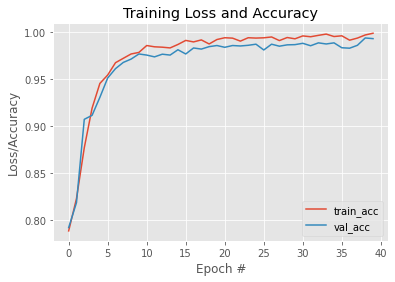

In [ ]:


from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 40
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

##Initializations

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
from tensorflow.keras import initializers
class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_initializer= initializers.GlorotUniform(seed=None) ))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 25ms/step - loss: 0.5082 - accuracy: 0.7828 - val_loss: 0.4556 - val_accuracy: 0.7845
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.4103 - accuracy: 0.8122 - val_loss: 0.4433 - val_accuracy: 0.7802
Epoch 3/20
133/133 [==============================] - 3s 23ms/step - loss: 0.3143 - accuracy: 0.8631 - val_loss: 0.2629 - val_accuracy: 0.8868
Epoch 4/20
133/133 [==============================] - 3s 23ms/step - loss: 0.2009 - accuracy: 0.9149 - val_loss: 0.1889 - val_accuracy: 0.9208
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1495 - accuracy: 0.9385 - val_loss: 0.1794 - val_accuracy: 0.9260
Epoch 6/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1131 - accuracy: 0.9535 - val_loss: 0.1401 - val_accuracy: 0.9441
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0980 - a

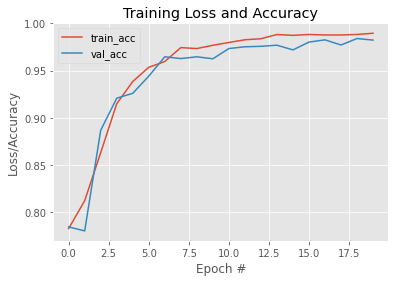

In [ ]:
from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
from tensorflow.keras import initializers
class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_initializer= initializers.Zeros() ))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 25ms/step - loss: 0.6591 - accuracy: 0.7838 - val_loss: 0.6322 - val_accuracy: 0.7713
Epoch 2/20
133/133 [==============================] - 3s 23ms/step - loss: 0.6065 - accuracy: 0.7838 - val_loss: 0.5924 - val_accuracy: 0.7713
Epoch 3/20
133/133 [==============================] - 3s 23ms/step - loss: 0.5723 - accuracy: 0.7838 - val_loss: 0.5679 - val_accuracy: 0.7713
Epoch 4/20
133/133 [==============================] - 3s 24ms/step - loss: 0.5506 - accuracy: 0.7838 - val_loss: 0.5531 - val_accuracy: 0.7713
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.5376 - accuracy: 0.7838 - val_loss: 0.5449 - val_accuracy: 0.7713
Epoch 6/20
133/133 [==============================] - 3s 24ms/step - loss: 0.5302 - accuracy: 0.7838 - val_loss: 0.5407 - val_accuracy: 0.7713
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.5261 - a

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


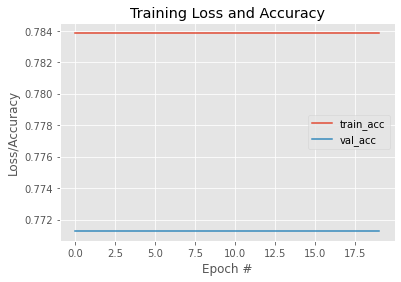

In [ ]:
from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
from tensorflow.keras import initializers
class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_initializer= initializers.Ones() ))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 24ms/step - loss: 5.5455 - accuracy: 0.7523 - val_loss: 0.4776 - val_accuracy: 0.7826
Epoch 2/20
133/133 [==============================] - 3s 23ms/step - loss: 0.4584 - accuracy: 0.7993 - val_loss: 0.4236 - val_accuracy: 0.8104
Epoch 3/20
133/133 [==============================] - 3s 24ms/step - loss: 0.4166 - accuracy: 0.8180 - val_loss: 0.3846 - val_accuracy: 0.8279
Epoch 4/20
133/133 [==============================] - 3s 23ms/step - loss: 0.3653 - accuracy: 0.8411 - val_loss: 0.3554 - val_accuracy: 0.8458
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.3273 - accuracy: 0.8602 - val_loss: 0.3172 - val_accuracy: 0.8618
Epoch 6/20
133/133 [==============================] - 3s 24ms/step - loss: 0.2937 - accuracy: 0.8764 - val_loss: 0.3353 - val_accuracy: 0.8522
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.2583 - a

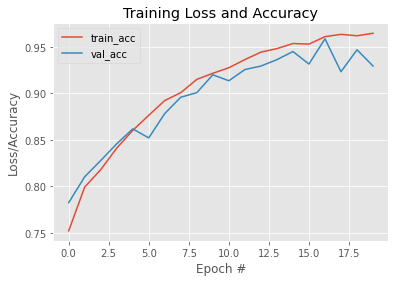

In [ ]:
from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
from tensorflow.keras import initializers
class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_initializer= initializers.RandomUniform(minval=-0.05, maxval=0.05, seed=None) ))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 25ms/step - loss: 0.4935 - accuracy: 0.7818 - val_loss: 0.4276 - val_accuracy: 0.7894
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.3669 - accuracy: 0.8321 - val_loss: 0.2828 - val_accuracy: 0.8670
Epoch 3/20
133/133 [==============================] - 3s 23ms/step - loss: 0.2371 - accuracy: 0.8960 - val_loss: 0.1934 - val_accuracy: 0.9168
Epoch 4/20
133/133 [==============================] - 3s 23ms/step - loss: 0.1515 - accuracy: 0.9388 - val_loss: 0.1298 - val_accuracy: 0.9481
Epoch 5/20
133/133 [==============================] - 3s 23ms/step - loss: 0.1020 - accuracy: 0.9599 - val_loss: 0.1024 - val_accuracy: 0.9637
Epoch 6/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0805 - accuracy: 0.9681 - val_loss: 0.1057 - val_accuracy: 0.9552
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0626 - a

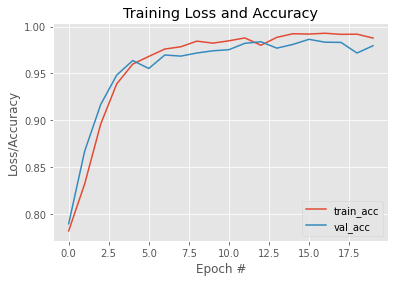

In [ ]:
from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
import tensorflow as tf
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.datasets import mnist
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.utils import to_categorical
from sklearn.externals import  joblib
from tensorflow.keras import initializers
class LeNet:
    # create the architecture
    def build(height, width, depth, classes):
        # create a feedforward neural net
        model = Sequential()
        
        # add a convolutional layer & max pooling layer
        model.add(Conv2D(32, (5, 5), padding = 'same', input_shape = (height, width, depth), kernel_initializer= initializers.RandomNormal(mean=0.0, stddev=0.05, seed=None) ))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional & max pooling layer
        model.add(Conv2D(64, (5, 5), padding= 'same'))
        model.add(Activation('relu'))
        model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))
        
        # add another convolutional layer
        model.add(Conv2D(128, (5, 5), padding = 'same'))
        model.add(Activation('relu'))
        
        # add a fully-connected layer
        model.add(Flatten())
        model.add(Dense(500))
        model.add(Activation('relu'))
        
        # add a softmax classifier
        model.add(Dense(classes))
        model.add(Activation('softmax'))
        
        # return the constructed model
        return model

(35343, 50, 50, 3)
(35343, 1)
[INFO] training network...
Epoch 1/20
133/133 [==============================] - 3s 25ms/step - loss: 0.5089 - accuracy: 0.7846 - val_loss: 0.4700 - val_accuracy: 0.7699
Epoch 2/20
133/133 [==============================] - 3s 24ms/step - loss: 0.4081 - accuracy: 0.8130 - val_loss: 0.3662 - val_accuracy: 0.8364
Epoch 3/20
133/133 [==============================] - 3s 23ms/step - loss: 0.3177 - accuracy: 0.8595 - val_loss: 0.2798 - val_accuracy: 0.8767
Epoch 4/20
133/133 [==============================] - 3s 24ms/step - loss: 0.2322 - accuracy: 0.8993 - val_loss: 0.2106 - val_accuracy: 0.9078
Epoch 5/20
133/133 [==============================] - 3s 24ms/step - loss: 0.1537 - accuracy: 0.9352 - val_loss: 0.2036 - val_accuracy: 0.9161
Epoch 6/20
133/133 [==============================] - 3s 23ms/step - loss: 0.1115 - accuracy: 0.9541 - val_loss: 0.1393 - val_accuracy: 0.9451
Epoch 7/20
133/133 [==============================] - 3s 24ms/step - loss: 0.0910 - a

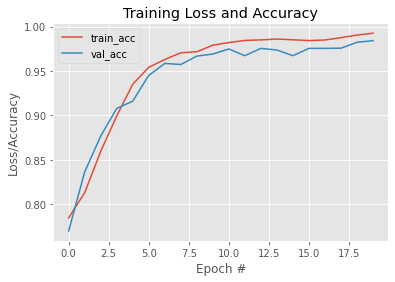

In [ ]:
from tensorflow.keras.utils import to_categorical

tf.keras.backend.clear_session()


print(X.shape)


print(Y.shape)



#Spliting the train ,test  and Validation data
(trainX, testX, trainY, testY) = train_test_split(X, Y, test_size = 0.40, random_state = 1)
(testX,valX,testY,valY) = train_test_split(testX, testY, test_size = 0.50, random_state = 1)






#Scaling the data
trainX = trainX.astype('float32')/255.0
testX = testX.astype('float32')/255.0
 
#Conversion into categorical format
trainY = to_categorical(trainY, 2)
testY = to_categorical(testY, 2)

#Building the LeNet
model_lenet = LeNet.build(50, 50, 3, 2)
#Compile the model
model_lenet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

print("[INFO] training network...")
maxIt = 20
H = model_lenet.fit(trainX, trainY, validation_split = 0.20, batch_size = 128, epochs = maxIt, verbose = 1)
print(model_lenet.summary())

#Saving the model to be used further
#joblib.dump(model_lenet,"/content/drive/MyDrive/Deep_Fake/model_lenet")
#Performance Measurement.
print('\n Test accuracy')
predictedY = model_lenet.predict(testX)
predictedY = predictedY.argmax(axis=1)
testY = testY.argmax(axis=1)
print(classification_report(testY, predictedY))

# plot the training loss and accuracy
plt.style.use("ggplot")
plt.figure()
#plt.plot(np.arange(0, maxIt), H.history["loss"], label="train_loss")
#plt.plot(np.arange(0, maxIt), H.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, maxIt), H.history["accuracy"], label="train_acc")
plt.plot(np.arange(0, maxIt), H.history["val_accuracy"], label="val_acc")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()

#Deployment

In [ ]:
!pip install -U ipykernel

     |████████████████████████████████| 122kB 5.4MB/s 
ERROR: google-colab 1.0.0 has requirement ipykernel~=4.10, but you'll have ipykernel 5.3.4 which is incompatible.
  Found existing installation: ipykernel 4.10.1
    Uninstalling ipykernel-4.10.1:
      Successfully uninstalled ipykernel-4.10.1


In [ ]:
!pip install -q streamlit

     |████████████████████████████████| 143kB 5.7MB/s 
ERROR: requests 2.23.0 has requirement urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you'll have urllib3 1.26.2 which is incompatible.
ERROR: google-colab 1.0.0 has requirement ipykernel~=4.10, but you'll have ipykernel 5.3.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.


In [ ]:
!pip install pyngrok

  Created wheel for pyngrok: filename=pyngrok-5.0.0-cp36-none-any.whl size=18780 sha256=baff1bd61512da2566a48badc4783bfabd249c79d6c6cce742d91d0a684eff45
  Stored in directory: /root/.cache/pip/wheels/95/df/23/af8dde08c3fcdc7b966adcacef48ab29aa3b0b1860df5d2b79
Successfully built pyngrok


In [ ]:
!pip install -U flask-cors

In [ ]:
!pip install flask-ngrok
!pip install gevent

!python /content/drive/MyDrive/Deep_Fake/Deployment/Deployment-Deep-Learning-Model-master/app.py

2020-11-24 03:29:01.583579: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-11-24 03:29:03.507979: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-11-24 03:29:03.518026: E tensorflow/stream_executor/cuda/cuda_driver.cc:314] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2020-11-24 03:29:03.518085: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (52b1fa67eedf): /proc/driver/nvidia/version does not exist
2020-11-24 03:29:03.525097: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2200000000 Hz
2020-11-24 03:29:03.525390: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x17b4840 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-11-24 03:29:03.525434: I tensorflow/com

In [ ]:
!python /content/drive/MyDrive/Deep_Fake/Deployment/Deployment-Deep-Learning-Model-master/app.py

2020-11-24 03:28:10.252249: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-11-24 03:28:14.904674: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-11-24 03:28:15.009731: E tensorflow/stream_executor/cuda/cuda_driver.cc:314] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2020-11-24 03:28:15.009801: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (52b1fa67eedf): /proc/driver/nvidia/version does not exist
2020-11-24 03:28:15.039075: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2200000000 Hz
2020-11-24 03:28:15.039574: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x2e56840 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-11-24 03:28:15.039659: I tensorflow/com

In [ ]:
!pip install flask-ngrok